# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

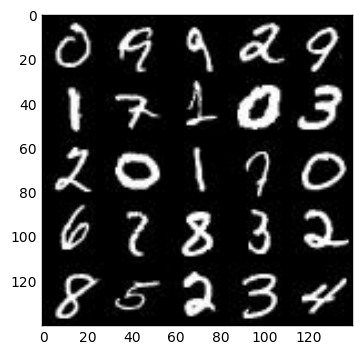

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

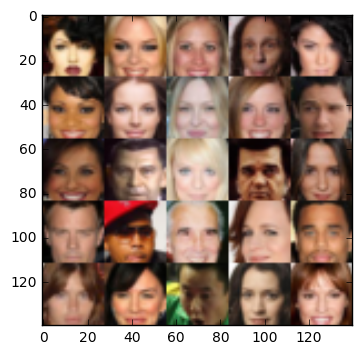

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')
    input_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    lr = tf.placeholder(tf.float32, name='learning_rate')

    return input_real, input_z, lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False, alpha=0.01):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        # input layer is 28x28x3
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='SAME')
        x1 = tf.maximum(alpha*x1, x1)
        # 14x14x64
        
        x2 = tf.layers.conv2d(x1, 128, 5, strides=2, padding='SAME')
        x2 = tf.layers.batch_normalization(x2, training=True)
        x2 = tf.maximum(alpha*x2, x2)
        # 7x7x128
        
        x3 = tf.layers.conv2d(x2, 256, 5, strides=2, padding='SAME')
        x3 = tf.layers.batch_normalization(x3, training=True)
        x3 = tf.maximum(alpha*x3, x3)
        # 4x4x256
        
        flat = tf.reshape(x3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)

    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True, alpha=0.01):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse= not is_train): #why not reuse=reuse?
        x1 = tf.layers.dense(z, 7*7*256)
        x1 = tf.reshape(x1, (-1, 7, 7, 256))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha*x1, x1)
        # 7x7x256
        
        x2 = tf.layers.conv2d_transpose(x1, 128, 5, strides=2, padding='SAME')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha*x2, x2)
        # 14x14x128
        
        x3 = tf.layers.conv2d_transpose(x2, 64, 5, strides=2, padding='SAME')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha*x3, x3)
        # 28x28x64
        
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=1, padding='SAME')
        out = tf.tanh(logits)
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.01):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    #based on suggestion from forum
    """We force both d_train_opt and g_train_opt to depend on tf.GraphKeys.UPDATE_OPS being finished.
    The tf.GraphKeys.UPDATE_OPS basically compute the mean and the deviation for normalizing the output. 
    This means that they depend on input_real.
    Thus, g_train_opt, that artificially depends on tf.GraphKeys.UPDATE_OPS, will also depend on input_real."""
    
    vars = tf.trainable_variables()
    d_vars = [var for var in vars if var.name.startswith('discriminator')]
    g_vars = [var for var in vars if var.name.startswith('generator')]
    all_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)

    g_update_ops = [var for var in all_update_ops if var.name.startswith('generator')]
    d_update_ops = [var for var in all_update_ops if var.name.startswith('discriminator')]

    with tf.control_dependencies(d_update_ops):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1 = beta1).minimize(d_loss, var_list = d_vars)
    with tf.control_dependencies(g_update_ops):
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1 = beta1).minimize(g_loss, var_list = g_vars)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    _, img_w, img_h, img_d = data_shape
    input_real, input_z, lr = model_inputs(img_w, img_h, img_d, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, img_d)
    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)

    samples = []
    steps = 0
    
    saver = tf.train.Saver()
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                #TODO: Train Model.
                steps += 1
                batch_images =  batch_images * 2.0
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, lr: learning_rate})
                
                if steps % 100 == 0:
                    show_generator_output(sess, 25, input_z, img_d, data_image_mode)
                
                if steps % 10 == 0:                    
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    
        saver.save(sess, './generator.ckpt')
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 0.5684... Generator Loss: 1.1143
Epoch 1/2... Discriminator Loss: 0.6234... Generator Loss: 1.1447
Epoch 1/2... Discriminator Loss: 0.6174... Generator Loss: 1.3133
Epoch 1/2... Discriminator Loss: 1.0712... Generator Loss: 0.5018
Epoch 1/2... Discriminator Loss: 0.4088... Generator Loss: 1.7871
Epoch 1/2... Discriminator Loss: 0.6273... Generator Loss: 1.0382
Epoch 1/2... Discriminator Loss: 0.8272... Generator Loss: 0.8547
Epoch 1/2... Discriminator Loss: 0.7808... Generator Loss: 1.1918
Epoch 1/2... Discriminator Loss: 0.6158... Generator Loss: 1.9112


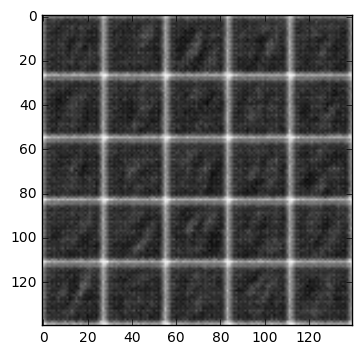

Epoch 1/2... Discriminator Loss: 1.0296... Generator Loss: 2.5110
Epoch 1/2... Discriminator Loss: 0.7637... Generator Loss: 1.0515
Epoch 1/2... Discriminator Loss: 0.7484... Generator Loss: 0.9791
Epoch 1/2... Discriminator Loss: 1.0548... Generator Loss: 0.6102
Epoch 1/2... Discriminator Loss: 0.8306... Generator Loss: 2.4096
Epoch 1/2... Discriminator Loss: 0.9579... Generator Loss: 0.7502
Epoch 1/2... Discriminator Loss: 0.7552... Generator Loss: 0.9195
Epoch 1/2... Discriminator Loss: 0.6686... Generator Loss: 1.0877
Epoch 1/2... Discriminator Loss: 1.4229... Generator Loss: 0.3357
Epoch 1/2... Discriminator Loss: 0.7202... Generator Loss: 1.1383


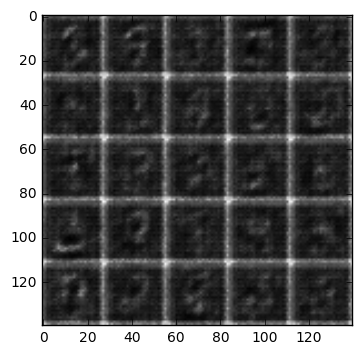

Epoch 1/2... Discriminator Loss: 0.6065... Generator Loss: 1.5328
Epoch 1/2... Discriminator Loss: 0.5767... Generator Loss: 1.5179
Epoch 1/2... Discriminator Loss: 1.0081... Generator Loss: 0.6235
Epoch 1/2... Discriminator Loss: 0.9623... Generator Loss: 0.6845
Epoch 1/2... Discriminator Loss: 0.6577... Generator Loss: 1.1596
Epoch 1/2... Discriminator Loss: 0.6649... Generator Loss: 2.4022
Epoch 1/2... Discriminator Loss: 0.7406... Generator Loss: 1.2292
Epoch 1/2... Discriminator Loss: 0.7781... Generator Loss: 2.0970
Epoch 1/2... Discriminator Loss: 0.4939... Generator Loss: 1.8930
Epoch 1/2... Discriminator Loss: 0.6717... Generator Loss: 1.0539


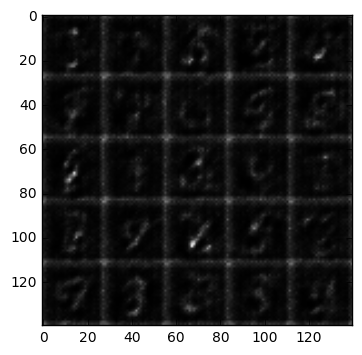

Epoch 1/2... Discriminator Loss: 0.7632... Generator Loss: 0.9914
Epoch 1/2... Discriminator Loss: 0.5445... Generator Loss: 1.4277
Epoch 1/2... Discriminator Loss: 0.6123... Generator Loss: 1.4502
Epoch 1/2... Discriminator Loss: 0.7579... Generator Loss: 1.0159
Epoch 1/2... Discriminator Loss: 0.6421... Generator Loss: 1.1194
Epoch 1/2... Discriminator Loss: 0.5760... Generator Loss: 2.4597
Epoch 1/2... Discriminator Loss: 0.5699... Generator Loss: 1.2491
Epoch 1/2... Discriminator Loss: 0.5854... Generator Loss: 1.2936
Epoch 1/2... Discriminator Loss: 1.1092... Generator Loss: 0.5096
Epoch 1/2... Discriminator Loss: 0.4686... Generator Loss: 1.6885


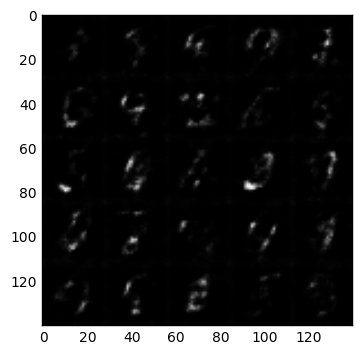

Epoch 1/2... Discriminator Loss: 0.6373... Generator Loss: 1.0735
Epoch 1/2... Discriminator Loss: 0.4453... Generator Loss: 1.5270
Epoch 1/2... Discriminator Loss: 0.9248... Generator Loss: 0.6656
Epoch 1/2... Discriminator Loss: 0.6047... Generator Loss: 1.1420
Epoch 1/2... Discriminator Loss: 0.7699... Generator Loss: 0.9811
Epoch 1/2... Discriminator Loss: 0.4925... Generator Loss: 1.4333
Epoch 1/2... Discriminator Loss: 0.9197... Generator Loss: 0.6578
Epoch 1/2... Discriminator Loss: 0.3542... Generator Loss: 2.0435
Epoch 1/2... Discriminator Loss: 0.9132... Generator Loss: 0.8788
Epoch 1/2... Discriminator Loss: 0.4976... Generator Loss: 1.5138


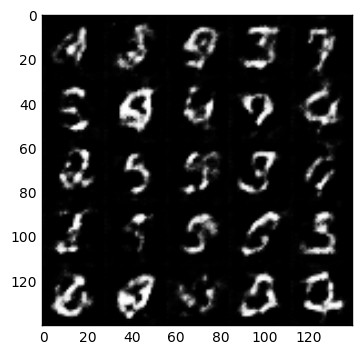

Epoch 1/2... Discriminator Loss: 0.4017... Generator Loss: 1.7379
Epoch 1/2... Discriminator Loss: 0.4864... Generator Loss: 1.3170
Epoch 1/2... Discriminator Loss: 0.5769... Generator Loss: 2.6836
Epoch 1/2... Discriminator Loss: 0.3985... Generator Loss: 2.3739
Epoch 1/2... Discriminator Loss: 0.6324... Generator Loss: 1.1676
Epoch 1/2... Discriminator Loss: 0.5193... Generator Loss: 1.4007
Epoch 1/2... Discriminator Loss: 0.6230... Generator Loss: 1.3674
Epoch 1/2... Discriminator Loss: 0.5662... Generator Loss: 1.4507
Epoch 1/2... Discriminator Loss: 0.6279... Generator Loss: 1.3273
Epoch 1/2... Discriminator Loss: 0.4136... Generator Loss: 1.9113


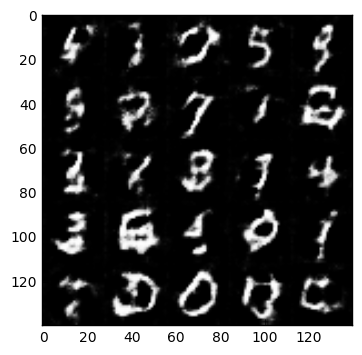

Epoch 1/2... Discriminator Loss: 0.6815... Generator Loss: 1.0171
Epoch 1/2... Discriminator Loss: 0.4691... Generator Loss: 1.8974
Epoch 1/2... Discriminator Loss: 0.4196... Generator Loss: 2.1892
Epoch 1/2... Discriminator Loss: 0.6560... Generator Loss: 1.1404
Epoch 1/2... Discriminator Loss: 0.5295... Generator Loss: 1.3381
Epoch 1/2... Discriminator Loss: 0.6194... Generator Loss: 1.3608
Epoch 1/2... Discriminator Loss: 0.5510... Generator Loss: 1.7662
Epoch 1/2... Discriminator Loss: 0.4691... Generator Loss: 1.7611
Epoch 1/2... Discriminator Loss: 0.6129... Generator Loss: 1.4346
Epoch 1/2... Discriminator Loss: 0.5524... Generator Loss: 1.3543


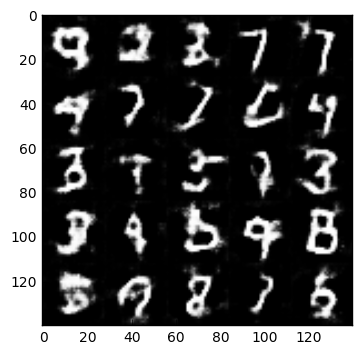

Epoch 1/2... Discriminator Loss: 0.4901... Generator Loss: 1.5788
Epoch 1/2... Discriminator Loss: 0.7961... Generator Loss: 1.2895
Epoch 1/2... Discriminator Loss: 0.5692... Generator Loss: 2.0690
Epoch 1/2... Discriminator Loss: 0.4505... Generator Loss: 1.7723
Epoch 1/2... Discriminator Loss: 0.6681... Generator Loss: 1.1226
Epoch 1/2... Discriminator Loss: 0.5563... Generator Loss: 1.3034
Epoch 1/2... Discriminator Loss: 0.5005... Generator Loss: 1.4668
Epoch 1/2... Discriminator Loss: 0.5957... Generator Loss: 1.5786
Epoch 1/2... Discriminator Loss: 0.6956... Generator Loss: 1.0869
Epoch 1/2... Discriminator Loss: 0.5980... Generator Loss: 1.6320


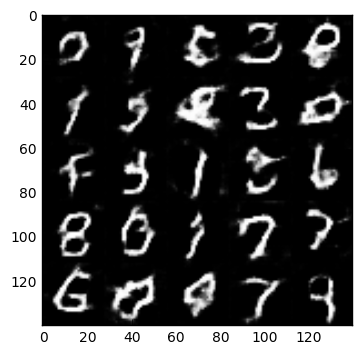

Epoch 1/2... Discriminator Loss: 0.5807... Generator Loss: 1.9614
Epoch 1/2... Discriminator Loss: 0.6793... Generator Loss: 1.0451
Epoch 1/2... Discriminator Loss: 0.4451... Generator Loss: 1.5794
Epoch 1/2... Discriminator Loss: 0.9753... Generator Loss: 0.6345
Epoch 1/2... Discriminator Loss: 0.6710... Generator Loss: 1.3689
Epoch 1/2... Discriminator Loss: 0.5353... Generator Loss: 1.3948
Epoch 1/2... Discriminator Loss: 0.6204... Generator Loss: 1.4705
Epoch 1/2... Discriminator Loss: 0.4377... Generator Loss: 2.2109
Epoch 1/2... Discriminator Loss: 0.7935... Generator Loss: 1.5126
Epoch 1/2... Discriminator Loss: 0.6907... Generator Loss: 1.1819


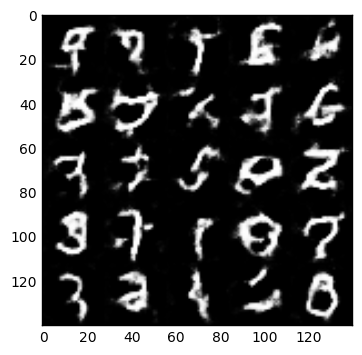

Epoch 1/2... Discriminator Loss: 0.8538... Generator Loss: 0.7970
Epoch 1/2... Discriminator Loss: 0.6080... Generator Loss: 1.5586
Epoch 1/2... Discriminator Loss: 0.8177... Generator Loss: 1.6315
Epoch 1/2... Discriminator Loss: 0.6256... Generator Loss: 1.2819
Epoch 1/2... Discriminator Loss: 0.8083... Generator Loss: 0.9126
Epoch 1/2... Discriminator Loss: 0.6735... Generator Loss: 1.0263
Epoch 1/2... Discriminator Loss: 0.7104... Generator Loss: 0.9861
Epoch 1/2... Discriminator Loss: 0.6537... Generator Loss: 1.9759
Epoch 1/2... Discriminator Loss: 0.6104... Generator Loss: 1.1889
Epoch 1/2... Discriminator Loss: 0.6523... Generator Loss: 1.0667


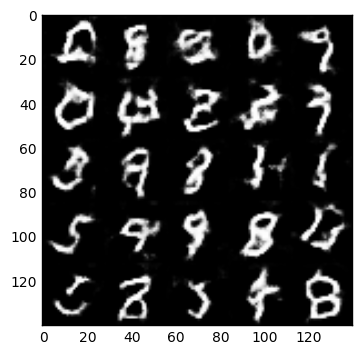

Epoch 1/2... Discriminator Loss: 0.7733... Generator Loss: 0.9574
Epoch 1/2... Discriminator Loss: 0.5261... Generator Loss: 1.6414
Epoch 1/2... Discriminator Loss: 0.5897... Generator Loss: 1.3529
Epoch 1/2... Discriminator Loss: 0.9892... Generator Loss: 0.7595
Epoch 1/2... Discriminator Loss: 0.6418... Generator Loss: 1.4524
Epoch 1/2... Discriminator Loss: 0.7730... Generator Loss: 0.8664
Epoch 1/2... Discriminator Loss: 0.7378... Generator Loss: 0.8680
Epoch 1/2... Discriminator Loss: 0.8419... Generator Loss: 2.4233
Epoch 1/2... Discriminator Loss: 0.8532... Generator Loss: 0.7559
Epoch 1/2... Discriminator Loss: 0.4913... Generator Loss: 1.9154


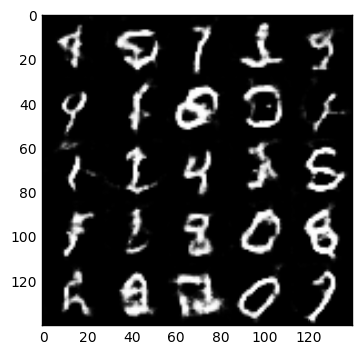

Epoch 1/2... Discriminator Loss: 0.6854... Generator Loss: 2.1554
Epoch 1/2... Discriminator Loss: 0.9278... Generator Loss: 0.7192
Epoch 1/2... Discriminator Loss: 0.5098... Generator Loss: 1.5885
Epoch 1/2... Discriminator Loss: 0.4130... Generator Loss: 2.0033
Epoch 1/2... Discriminator Loss: 0.7103... Generator Loss: 1.1583
Epoch 1/2... Discriminator Loss: 0.7065... Generator Loss: 1.1160
Epoch 1/2... Discriminator Loss: 0.7336... Generator Loss: 0.9462
Epoch 1/2... Discriminator Loss: 0.7740... Generator Loss: 1.1499
Epoch 1/2... Discriminator Loss: 1.0023... Generator Loss: 0.6320
Epoch 1/2... Discriminator Loss: 0.3912... Generator Loss: 1.8517


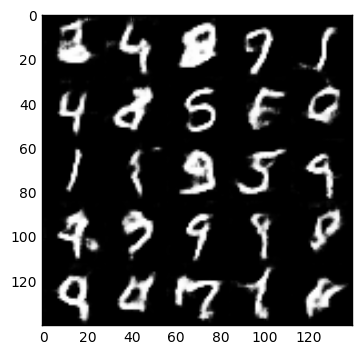

Epoch 1/2... Discriminator Loss: 0.9217... Generator Loss: 0.6777
Epoch 1/2... Discriminator Loss: 0.5608... Generator Loss: 1.2590
Epoch 1/2... Discriminator Loss: 0.5153... Generator Loss: 1.5872
Epoch 1/2... Discriminator Loss: 0.5461... Generator Loss: 1.8816
Epoch 1/2... Discriminator Loss: 0.5170... Generator Loss: 1.3736
Epoch 1/2... Discriminator Loss: 0.7879... Generator Loss: 1.1394
Epoch 1/2... Discriminator Loss: 0.5765... Generator Loss: 1.3590
Epoch 1/2... Discriminator Loss: 0.3379... Generator Loss: 1.6912
Epoch 1/2... Discriminator Loss: 0.5099... Generator Loss: 1.4282
Epoch 1/2... Discriminator Loss: 0.7177... Generator Loss: 1.0697


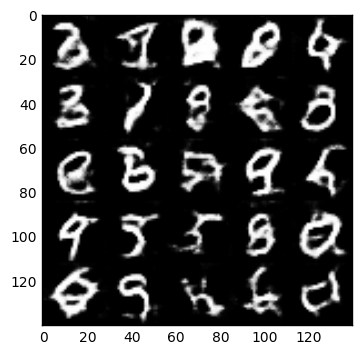

Epoch 1/2... Discriminator Loss: 0.6727... Generator Loss: 2.2166
Epoch 1/2... Discriminator Loss: 0.3912... Generator Loss: 1.9550
Epoch 1/2... Discriminator Loss: 0.6213... Generator Loss: 1.2012
Epoch 1/2... Discriminator Loss: 0.6131... Generator Loss: 1.0586
Epoch 1/2... Discriminator Loss: 0.7381... Generator Loss: 0.9730
Epoch 1/2... Discriminator Loss: 0.7407... Generator Loss: 0.9268
Epoch 1/2... Discriminator Loss: 0.5584... Generator Loss: 1.8296
Epoch 1/2... Discriminator Loss: 0.5189... Generator Loss: 1.3725
Epoch 1/2... Discriminator Loss: 0.7470... Generator Loss: 0.8571
Epoch 1/2... Discriminator Loss: 0.6071... Generator Loss: 2.0010


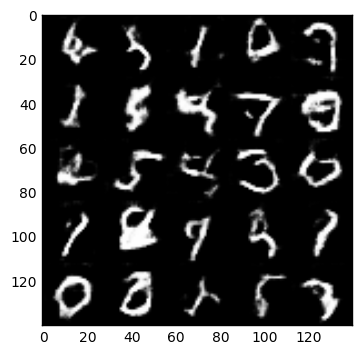

Epoch 1/2... Discriminator Loss: 0.4682... Generator Loss: 1.8193
Epoch 1/2... Discriminator Loss: 0.6982... Generator Loss: 0.9849
Epoch 1/2... Discriminator Loss: 0.5610... Generator Loss: 1.2631
Epoch 1/2... Discriminator Loss: 0.9764... Generator Loss: 0.6595
Epoch 1/2... Discriminator Loss: 0.7924... Generator Loss: 0.8989
Epoch 1/2... Discriminator Loss: 0.9509... Generator Loss: 0.7021
Epoch 1/2... Discriminator Loss: 0.6446... Generator Loss: 1.4196
Epoch 1/2... Discriminator Loss: 0.6817... Generator Loss: 0.9677
Epoch 1/2... Discriminator Loss: 0.7438... Generator Loss: 1.1050
Epoch 1/2... Discriminator Loss: 0.6245... Generator Loss: 0.9671


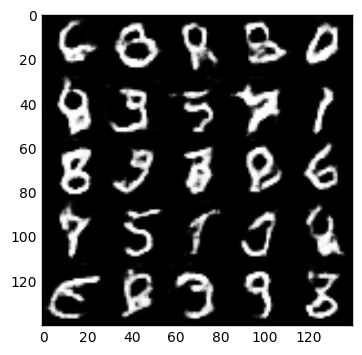

Epoch 1/2... Discriminator Loss: 0.5171... Generator Loss: 1.7049
Epoch 1/2... Discriminator Loss: 0.8316... Generator Loss: 0.8851
Epoch 1/2... Discriminator Loss: 0.6341... Generator Loss: 1.3530
Epoch 1/2... Discriminator Loss: 1.5328... Generator Loss: 0.3449
Epoch 1/2... Discriminator Loss: 0.6840... Generator Loss: 1.0101
Epoch 1/2... Discriminator Loss: 0.5951... Generator Loss: 1.5841
Epoch 1/2... Discriminator Loss: 0.5634... Generator Loss: 1.7376
Epoch 1/2... Discriminator Loss: 0.5786... Generator Loss: 1.6196
Epoch 1/2... Discriminator Loss: 0.4969... Generator Loss: 1.6399
Epoch 1/2... Discriminator Loss: 0.6912... Generator Loss: 0.9518


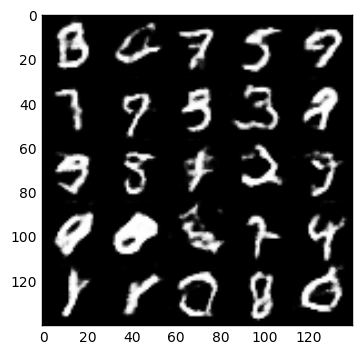

Epoch 1/2... Discriminator Loss: 0.4790... Generator Loss: 2.2643
Epoch 1/2... Discriminator Loss: 0.8231... Generator Loss: 0.8208
Epoch 1/2... Discriminator Loss: 0.4510... Generator Loss: 1.5395
Epoch 1/2... Discriminator Loss: 0.5798... Generator Loss: 1.1030
Epoch 1/2... Discriminator Loss: 0.5396... Generator Loss: 1.7680
Epoch 1/2... Discriminator Loss: 0.5410... Generator Loss: 2.4434
Epoch 1/2... Discriminator Loss: 0.5230... Generator Loss: 1.2174
Epoch 1/2... Discriminator Loss: 0.5004... Generator Loss: 1.2734
Epoch 1/2... Discriminator Loss: 0.9618... Generator Loss: 0.8522
Epoch 1/2... Discriminator Loss: 0.5301... Generator Loss: 1.2797


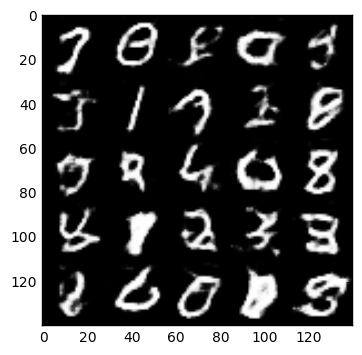

Epoch 1/2... Discriminator Loss: 0.6150... Generator Loss: 1.4629
Epoch 1/2... Discriminator Loss: 0.5636... Generator Loss: 1.4006
Epoch 1/2... Discriminator Loss: 0.6719... Generator Loss: 1.1205
Epoch 1/2... Discriminator Loss: 0.4413... Generator Loss: 1.8175
Epoch 1/2... Discriminator Loss: 0.3562... Generator Loss: 1.9303
Epoch 1/2... Discriminator Loss: 0.6279... Generator Loss: 1.0559
Epoch 1/2... Discriminator Loss: 0.5751... Generator Loss: 1.1802
Epoch 1/2... Discriminator Loss: 0.5755... Generator Loss: 1.3905
Epoch 1/2... Discriminator Loss: 0.6293... Generator Loss: 1.0600
Epoch 1/2... Discriminator Loss: 0.5077... Generator Loss: 1.3391


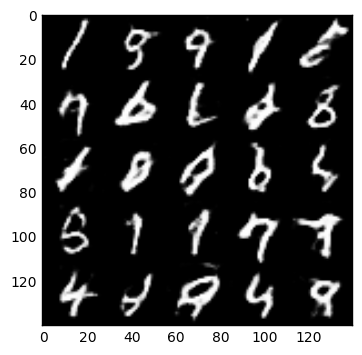

Epoch 1/2... Discriminator Loss: 0.7900... Generator Loss: 1.0739
Epoch 1/2... Discriminator Loss: 0.9092... Generator Loss: 1.7870
Epoch 1/2... Discriminator Loss: 1.6955... Generator Loss: 0.2634
Epoch 1/2... Discriminator Loss: 0.7259... Generator Loss: 1.0559
Epoch 1/2... Discriminator Loss: 0.4304... Generator Loss: 1.8649
Epoch 1/2... Discriminator Loss: 0.5659... Generator Loss: 1.7977
Epoch 1/2... Discriminator Loss: 0.4818... Generator Loss: 1.4117
Epoch 1/2... Discriminator Loss: 0.5590... Generator Loss: 1.1308
Epoch 2/2... Discriminator Loss: 0.4408... Generator Loss: 1.4776
Epoch 2/2... Discriminator Loss: 0.7265... Generator Loss: 0.8944


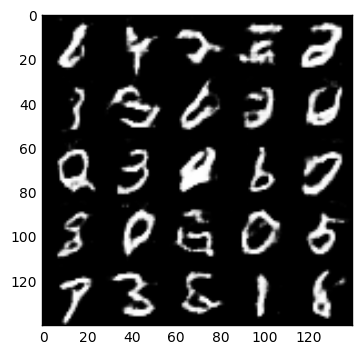

Epoch 2/2... Discriminator Loss: 0.8380... Generator Loss: 0.8223
Epoch 2/2... Discriminator Loss: 0.5221... Generator Loss: 1.3430
Epoch 2/2... Discriminator Loss: 0.7078... Generator Loss: 1.0197
Epoch 2/2... Discriminator Loss: 0.7117... Generator Loss: 0.9323
Epoch 2/2... Discriminator Loss: 0.5072... Generator Loss: 1.3463
Epoch 2/2... Discriminator Loss: 0.6328... Generator Loss: 1.1781
Epoch 2/2... Discriminator Loss: 0.7142... Generator Loss: 1.0097
Epoch 2/2... Discriminator Loss: 0.7059... Generator Loss: 0.9774
Epoch 2/2... Discriminator Loss: 1.0207... Generator Loss: 0.5867
Epoch 2/2... Discriminator Loss: 0.4351... Generator Loss: 2.5240


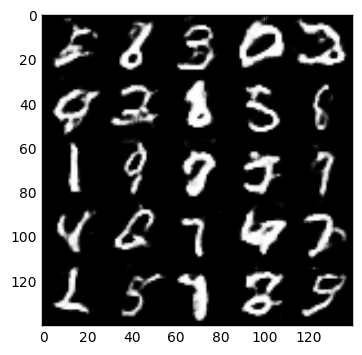

Epoch 2/2... Discriminator Loss: 0.4963... Generator Loss: 1.2728
Epoch 2/2... Discriminator Loss: 0.7206... Generator Loss: 1.0414
Epoch 2/2... Discriminator Loss: 0.4000... Generator Loss: 1.5896
Epoch 2/2... Discriminator Loss: 0.5444... Generator Loss: 1.3083
Epoch 2/2... Discriminator Loss: 0.5298... Generator Loss: 1.3122
Epoch 2/2... Discriminator Loss: 0.5519... Generator Loss: 1.1864
Epoch 2/2... Discriminator Loss: 0.4495... Generator Loss: 1.5236
Epoch 2/2... Discriminator Loss: 0.4498... Generator Loss: 2.3145
Epoch 2/2... Discriminator Loss: 0.5951... Generator Loss: 1.4467
Epoch 2/2... Discriminator Loss: 0.4332... Generator Loss: 1.6668


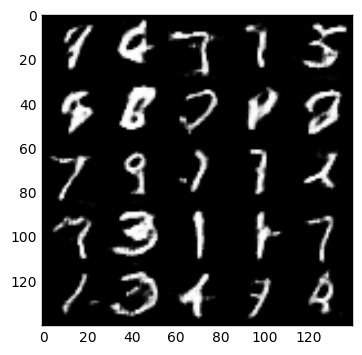

Epoch 2/2... Discriminator Loss: 0.6736... Generator Loss: 1.0143
Epoch 2/2... Discriminator Loss: 0.4421... Generator Loss: 1.4206
Epoch 2/2... Discriminator Loss: 1.0933... Generator Loss: 0.5264
Epoch 2/2... Discriminator Loss: 0.9137... Generator Loss: 0.7723
Epoch 2/2... Discriminator Loss: 0.6238... Generator Loss: 1.0121
Epoch 2/2... Discriminator Loss: 0.9629... Generator Loss: 0.7745
Epoch 2/2... Discriminator Loss: 0.5145... Generator Loss: 2.1246
Epoch 2/2... Discriminator Loss: 0.4465... Generator Loss: 1.6305
Epoch 2/2... Discriminator Loss: 0.4447... Generator Loss: 1.4820
Epoch 2/2... Discriminator Loss: 0.4435... Generator Loss: 1.5284


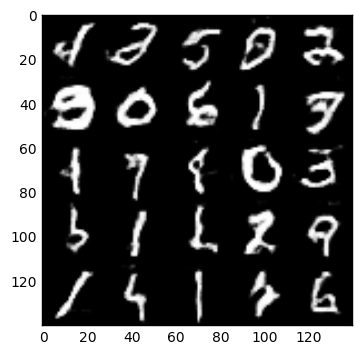

Epoch 2/2... Discriminator Loss: 0.4856... Generator Loss: 1.3605
Epoch 2/2... Discriminator Loss: 1.0466... Generator Loss: 0.6523
Epoch 2/2... Discriminator Loss: 0.4794... Generator Loss: 1.4750
Epoch 2/2... Discriminator Loss: 1.2205... Generator Loss: 0.4278
Epoch 2/2... Discriminator Loss: 0.5613... Generator Loss: 1.3512
Epoch 2/2... Discriminator Loss: 0.5601... Generator Loss: 1.1841
Epoch 2/2... Discriminator Loss: 1.0120... Generator Loss: 0.5977
Epoch 2/2... Discriminator Loss: 0.3401... Generator Loss: 2.0826
Epoch 2/2... Discriminator Loss: 0.8535... Generator Loss: 0.8088
Epoch 2/2... Discriminator Loss: 0.3814... Generator Loss: 1.9139


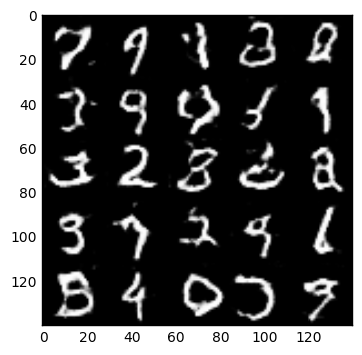

Epoch 2/2... Discriminator Loss: 0.3902... Generator Loss: 1.9636
Epoch 2/2... Discriminator Loss: 0.4531... Generator Loss: 1.7651
Epoch 2/2... Discriminator Loss: 0.6392... Generator Loss: 1.0026
Epoch 2/2... Discriminator Loss: 0.4628... Generator Loss: 2.2423
Epoch 2/2... Discriminator Loss: 0.6542... Generator Loss: 1.0995
Epoch 2/2... Discriminator Loss: 0.6459... Generator Loss: 0.9720
Epoch 2/2... Discriminator Loss: 0.4823... Generator Loss: 1.4413
Epoch 2/2... Discriminator Loss: 0.5235... Generator Loss: 1.2567
Epoch 2/2... Discriminator Loss: 0.5390... Generator Loss: 1.1365
Epoch 2/2... Discriminator Loss: 0.3288... Generator Loss: 2.0204


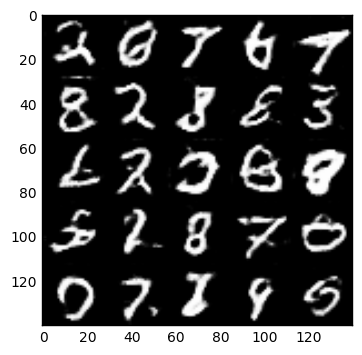

Epoch 2/2... Discriminator Loss: 0.8023... Generator Loss: 0.9462
Epoch 2/2... Discriminator Loss: 0.7277... Generator Loss: 0.9687
Epoch 2/2... Discriminator Loss: 0.5945... Generator Loss: 1.2462
Epoch 2/2... Discriminator Loss: 0.5304... Generator Loss: 1.3551
Epoch 2/2... Discriminator Loss: 0.6584... Generator Loss: 1.0392
Epoch 2/2... Discriminator Loss: 0.4639... Generator Loss: 1.4305
Epoch 2/2... Discriminator Loss: 0.5756... Generator Loss: 2.4004
Epoch 2/2... Discriminator Loss: 0.5641... Generator Loss: 1.2651
Epoch 2/2... Discriminator Loss: 0.6552... Generator Loss: 1.0475
Epoch 2/2... Discriminator Loss: 0.6391... Generator Loss: 1.0536


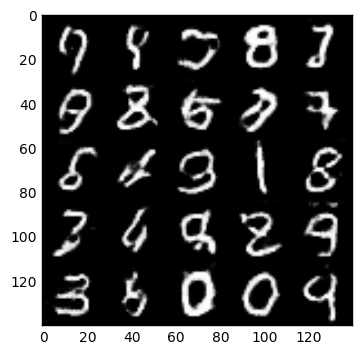

Epoch 2/2... Discriminator Loss: 0.4441... Generator Loss: 1.7402
Epoch 2/2... Discriminator Loss: 1.1282... Generator Loss: 0.6070
Epoch 2/2... Discriminator Loss: 0.4808... Generator Loss: 2.9015
Epoch 2/2... Discriminator Loss: 0.4798... Generator Loss: 1.5788
Epoch 2/2... Discriminator Loss: 0.9478... Generator Loss: 0.7181
Epoch 2/2... Discriminator Loss: 0.6282... Generator Loss: 1.0816
Epoch 2/2... Discriminator Loss: 0.3742... Generator Loss: 1.9966
Epoch 2/2... Discriminator Loss: 0.5001... Generator Loss: 1.3879
Epoch 2/2... Discriminator Loss: 0.4024... Generator Loss: 1.7198
Epoch 2/2... Discriminator Loss: 0.5540... Generator Loss: 1.4805


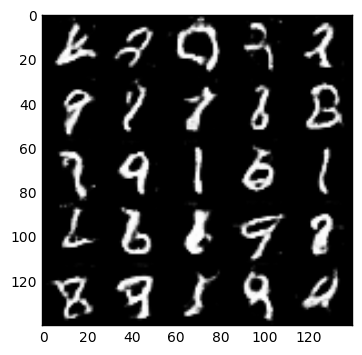

Epoch 2/2... Discriminator Loss: 0.5616... Generator Loss: 2.2361
Epoch 2/2... Discriminator Loss: 0.5109... Generator Loss: 1.2342
Epoch 2/2... Discriminator Loss: 0.5587... Generator Loss: 1.2449
Epoch 2/2... Discriminator Loss: 0.6148... Generator Loss: 2.3168
Epoch 2/2... Discriminator Loss: 0.6882... Generator Loss: 2.3850
Epoch 2/2... Discriminator Loss: 0.6518... Generator Loss: 1.0932
Epoch 2/2... Discriminator Loss: 0.5872... Generator Loss: 1.3179
Epoch 2/2... Discriminator Loss: 0.4517... Generator Loss: 1.5754
Epoch 2/2... Discriminator Loss: 1.3042... Generator Loss: 0.4059
Epoch 2/2... Discriminator Loss: 0.6328... Generator Loss: 1.1684


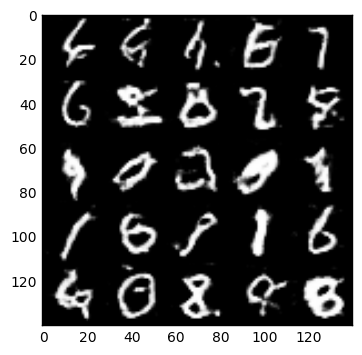

Epoch 2/2... Discriminator Loss: 0.3579... Generator Loss: 1.8380
Epoch 2/2... Discriminator Loss: 1.8045... Generator Loss: 0.2588
Epoch 2/2... Discriminator Loss: 0.6182... Generator Loss: 0.9942
Epoch 2/2... Discriminator Loss: 0.4787... Generator Loss: 1.4239
Epoch 2/2... Discriminator Loss: 0.6604... Generator Loss: 1.0735
Epoch 2/2... Discriminator Loss: 0.5544... Generator Loss: 1.2200
Epoch 2/2... Discriminator Loss: 0.4930... Generator Loss: 1.3159
Epoch 2/2... Discriminator Loss: 0.3938... Generator Loss: 1.8881
Epoch 2/2... Discriminator Loss: 0.8929... Generator Loss: 0.7464
Epoch 2/2... Discriminator Loss: 0.6707... Generator Loss: 1.0909


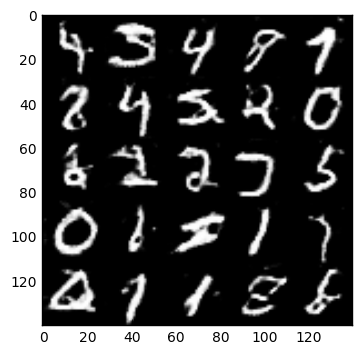

Epoch 2/2... Discriminator Loss: 0.3081... Generator Loss: 2.3357
Epoch 2/2... Discriminator Loss: 0.7170... Generator Loss: 1.0171
Epoch 2/2... Discriminator Loss: 0.3786... Generator Loss: 1.6559
Epoch 2/2... Discriminator Loss: 0.2573... Generator Loss: 2.0582
Epoch 2/2... Discriminator Loss: 0.5349... Generator Loss: 1.2659
Epoch 2/2... Discriminator Loss: 0.4606... Generator Loss: 1.4802
Epoch 2/2... Discriminator Loss: 1.0135... Generator Loss: 0.7221
Epoch 2/2... Discriminator Loss: 0.7665... Generator Loss: 0.8118
Epoch 2/2... Discriminator Loss: 0.5005... Generator Loss: 1.6812
Epoch 2/2... Discriminator Loss: 0.3775... Generator Loss: 1.9862


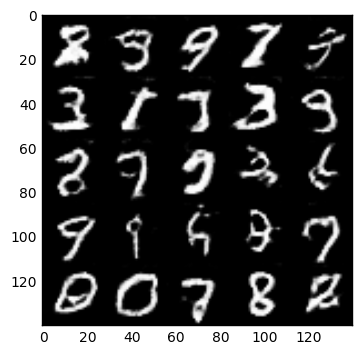

Epoch 2/2... Discriminator Loss: 0.3644... Generator Loss: 1.9165
Epoch 2/2... Discriminator Loss: 0.4160... Generator Loss: 1.5496
Epoch 2/2... Discriminator Loss: 0.6768... Generator Loss: 1.4470
Epoch 2/2... Discriminator Loss: 0.5193... Generator Loss: 1.5381
Epoch 2/2... Discriminator Loss: 0.3613... Generator Loss: 1.9032
Epoch 2/2... Discriminator Loss: 0.4785... Generator Loss: 1.5315
Epoch 2/2... Discriminator Loss: 0.3064... Generator Loss: 2.1505
Epoch 2/2... Discriminator Loss: 0.3513... Generator Loss: 1.6596
Epoch 2/2... Discriminator Loss: 0.2790... Generator Loss: 2.5578
Epoch 2/2... Discriminator Loss: 0.4372... Generator Loss: 1.4336


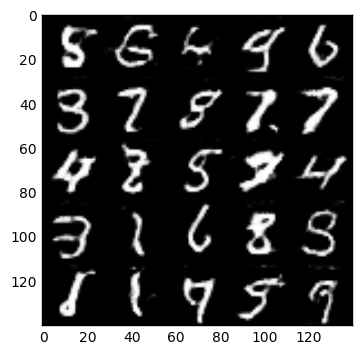

Epoch 2/2... Discriminator Loss: 0.5243... Generator Loss: 1.3070
Epoch 2/2... Discriminator Loss: 0.9116... Generator Loss: 0.7122
Epoch 2/2... Discriminator Loss: 0.7488... Generator Loss: 0.8933
Epoch 2/2... Discriminator Loss: 0.4676... Generator Loss: 1.3163
Epoch 2/2... Discriminator Loss: 0.7665... Generator Loss: 0.8408
Epoch 2/2... Discriminator Loss: 0.6435... Generator Loss: 2.4983
Epoch 2/2... Discriminator Loss: 0.3282... Generator Loss: 1.7943
Epoch 2/2... Discriminator Loss: 0.4163... Generator Loss: 1.5119
Epoch 2/2... Discriminator Loss: 0.5568... Generator Loss: 1.2466
Epoch 2/2... Discriminator Loss: 0.7104... Generator Loss: 1.0590


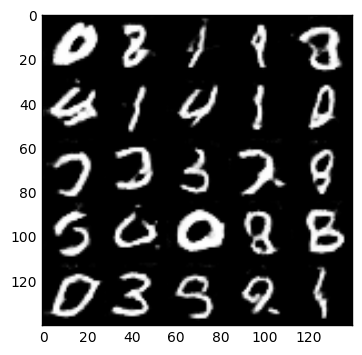

Epoch 2/2... Discriminator Loss: 0.7235... Generator Loss: 1.0300
Epoch 2/2... Discriminator Loss: 1.3379... Generator Loss: 4.5743
Epoch 2/2... Discriminator Loss: 0.3944... Generator Loss: 1.5150
Epoch 2/2... Discriminator Loss: 0.3804... Generator Loss: 2.0466
Epoch 2/2... Discriminator Loss: 0.4720... Generator Loss: 1.2366
Epoch 2/2... Discriminator Loss: 0.5680... Generator Loss: 1.2811
Epoch 2/2... Discriminator Loss: 0.2743... Generator Loss: 2.2791
Epoch 2/2... Discriminator Loss: 0.3476... Generator Loss: 1.8325
Epoch 2/2... Discriminator Loss: 0.6695... Generator Loss: 1.0634
Epoch 2/2... Discriminator Loss: 0.2256... Generator Loss: 2.4689


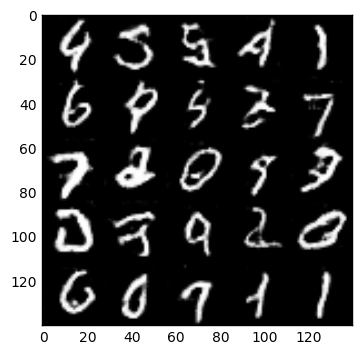

Epoch 2/2... Discriminator Loss: 0.5197... Generator Loss: 1.4235
Epoch 2/2... Discriminator Loss: 0.7121... Generator Loss: 1.0852
Epoch 2/2... Discriminator Loss: 0.5319... Generator Loss: 1.3181
Epoch 2/2... Discriminator Loss: 0.7744... Generator Loss: 0.9983
Epoch 2/2... Discriminator Loss: 0.3563... Generator Loss: 2.7448
Epoch 2/2... Discriminator Loss: 0.4168... Generator Loss: 1.9190
Epoch 2/2... Discriminator Loss: 0.1934... Generator Loss: 3.0909
Epoch 2/2... Discriminator Loss: 0.5279... Generator Loss: 1.4481
Epoch 2/2... Discriminator Loss: 0.3785... Generator Loss: 1.8545
Epoch 2/2... Discriminator Loss: 0.8795... Generator Loss: 0.8219


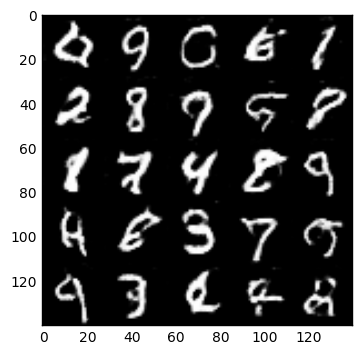

Epoch 2/2... Discriminator Loss: 0.9459... Generator Loss: 0.7869
Epoch 2/2... Discriminator Loss: 0.6935... Generator Loss: 2.6625
Epoch 2/2... Discriminator Loss: 0.5459... Generator Loss: 1.6865
Epoch 2/2... Discriminator Loss: 0.2869... Generator Loss: 2.1401
Epoch 2/2... Discriminator Loss: 0.4993... Generator Loss: 1.3710
Epoch 2/2... Discriminator Loss: 0.6692... Generator Loss: 1.0806
Epoch 2/2... Discriminator Loss: 0.1838... Generator Loss: 2.9186
Epoch 2/2... Discriminator Loss: 0.3777... Generator Loss: 1.4790
Epoch 2/2... Discriminator Loss: 0.4356... Generator Loss: 1.5342
Epoch 2/2... Discriminator Loss: 0.4648... Generator Loss: 1.3234


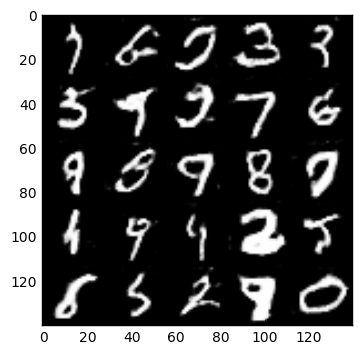

Epoch 2/2... Discriminator Loss: 0.3422... Generator Loss: 1.5389
Epoch 2/2... Discriminator Loss: 0.4464... Generator Loss: 1.5492
Epoch 2/2... Discriminator Loss: 1.0153... Generator Loss: 0.6250
Epoch 2/2... Discriminator Loss: 0.2724... Generator Loss: 2.1434
Epoch 2/2... Discriminator Loss: 0.7026... Generator Loss: 1.0889
Epoch 2/2... Discriminator Loss: 0.4656... Generator Loss: 1.4572
Epoch 2/2... Discriminator Loss: 1.1165... Generator Loss: 0.7122
Epoch 2/2... Discriminator Loss: 0.4570... Generator Loss: 1.8937
Epoch 2/2... Discriminator Loss: 0.6234... Generator Loss: 2.7672
Epoch 2/2... Discriminator Loss: 1.0757... Generator Loss: 3.6257


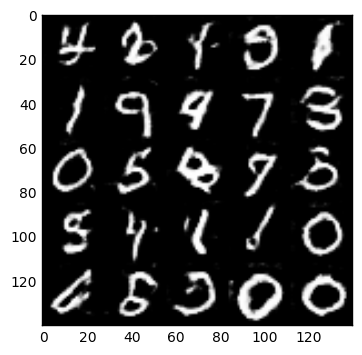

Epoch 2/2... Discriminator Loss: 0.6408... Generator Loss: 1.0103
Epoch 2/2... Discriminator Loss: 0.3731... Generator Loss: 1.7345
Epoch 2/2... Discriminator Loss: 0.4537... Generator Loss: 1.7629
Epoch 2/2... Discriminator Loss: 0.4423... Generator Loss: 1.5090
Epoch 2/2... Discriminator Loss: 0.4786... Generator Loss: 1.5447
Epoch 2/2... Discriminator Loss: 0.5620... Generator Loss: 1.1852
Epoch 2/2... Discriminator Loss: 0.4231... Generator Loss: 1.5558
Epoch 2/2... Discriminator Loss: 1.1751... Generator Loss: 0.5772
Epoch 2/2... Discriminator Loss: 0.6039... Generator Loss: 1.3090
Epoch 2/2... Discriminator Loss: 0.9990... Generator Loss: 2.5645


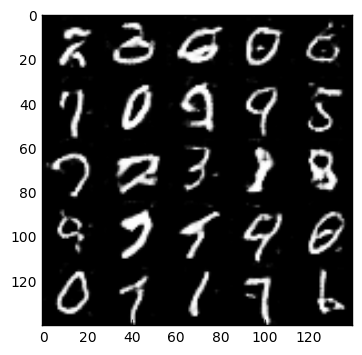

Epoch 2/2... Discriminator Loss: 1.2302... Generator Loss: 0.6108
Epoch 2/2... Discriminator Loss: 0.4278... Generator Loss: 2.3345
Epoch 2/2... Discriminator Loss: 0.5611... Generator Loss: 1.1996
Epoch 2/2... Discriminator Loss: 0.3864... Generator Loss: 1.7480
Epoch 2/2... Discriminator Loss: 0.6391... Generator Loss: 1.2261
Epoch 2/2... Discriminator Loss: 0.3349... Generator Loss: 1.9988
Epoch 2/2... Discriminator Loss: 0.3765... Generator Loss: 1.8085
Epoch 2/2... Discriminator Loss: 0.3473... Generator Loss: 1.7501
Epoch 2/2... Discriminator Loss: 0.4550... Generator Loss: 1.4815
Epoch 2/2... Discriminator Loss: 0.4151... Generator Loss: 1.4683


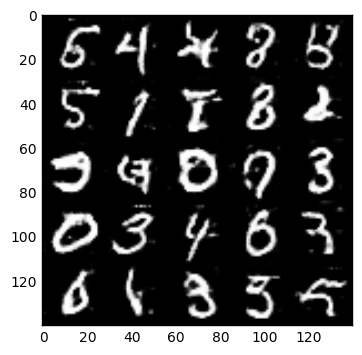

Epoch 2/2... Discriminator Loss: 0.5719... Generator Loss: 2.8343
Epoch 2/2... Discriminator Loss: 0.4934... Generator Loss: 1.3001
Epoch 2/2... Discriminator Loss: 0.7149... Generator Loss: 0.9620
Epoch 2/2... Discriminator Loss: 1.0328... Generator Loss: 0.6935
Epoch 2/2... Discriminator Loss: 0.6759... Generator Loss: 0.8887
Epoch 2/2... Discriminator Loss: 0.2845... Generator Loss: 1.7820


In [13]:
batch_size = 32
z_dim = 100
learning_rate = 0.0001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 0.5030... Generator Loss: 1.2186
Epoch 1/1... Discriminator Loss: 0.4297... Generator Loss: 1.3610
Epoch 1/1... Discriminator Loss: 0.2835... Generator Loss: 1.8918
Epoch 1/1... Discriminator Loss: 0.2462... Generator Loss: 1.8533
Epoch 1/1... Discriminator Loss: 0.1741... Generator Loss: 2.4086
Epoch 1/1... Discriminator Loss: 0.2147... Generator Loss: 2.1707
Epoch 1/1... Discriminator Loss: 0.6683... Generator Loss: 0.8779
Epoch 1/1... Discriminator Loss: 0.3695... Generator Loss: 1.4467
Epoch 1/1... Discriminator Loss: 0.4120... Generator Loss: 1.6902


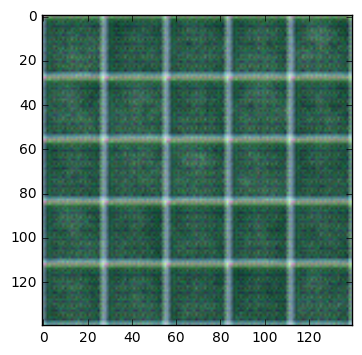

Epoch 1/1... Discriminator Loss: 0.3004... Generator Loss: 2.2287
Epoch 1/1... Discriminator Loss: 0.6380... Generator Loss: 0.9582
Epoch 1/1... Discriminator Loss: 0.2599... Generator Loss: 2.4517
Epoch 1/1... Discriminator Loss: 0.6707... Generator Loss: 1.2402
Epoch 1/1... Discriminator Loss: 0.1635... Generator Loss: 3.0947
Epoch 1/1... Discriminator Loss: 0.4767... Generator Loss: 2.0382
Epoch 1/1... Discriminator Loss: 0.3774... Generator Loss: 1.5893
Epoch 1/1... Discriminator Loss: 1.3913... Generator Loss: 0.3747
Epoch 1/1... Discriminator Loss: 0.4850... Generator Loss: 1.6711
Epoch 1/1... Discriminator Loss: 0.6055... Generator Loss: 1.0511


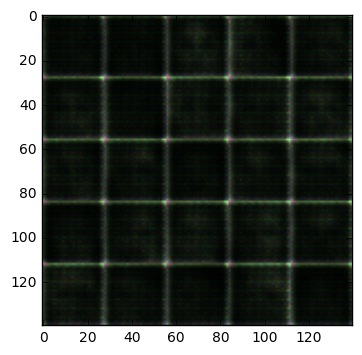

Epoch 1/1... Discriminator Loss: 0.5708... Generator Loss: 1.2721
Epoch 1/1... Discriminator Loss: 0.4613... Generator Loss: 1.6366
Epoch 1/1... Discriminator Loss: 0.3354... Generator Loss: 2.2196
Epoch 1/1... Discriminator Loss: 0.3066... Generator Loss: 2.0755
Epoch 1/1... Discriminator Loss: 0.4157... Generator Loss: 1.6422
Epoch 1/1... Discriminator Loss: 0.4649... Generator Loss: 1.6636
Epoch 1/1... Discriminator Loss: 0.4810... Generator Loss: 1.3762
Epoch 1/1... Discriminator Loss: 0.1694... Generator Loss: 2.9300
Epoch 1/1... Discriminator Loss: 0.3842... Generator Loss: 2.4586
Epoch 1/1... Discriminator Loss: 0.2875... Generator Loss: 2.0732


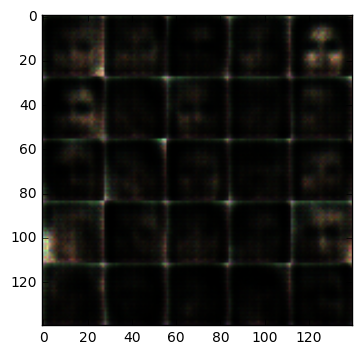

Epoch 1/1... Discriminator Loss: 0.2801... Generator Loss: 2.1978
Epoch 1/1... Discriminator Loss: 0.4328... Generator Loss: 3.4871
Epoch 1/1... Discriminator Loss: 0.8611... Generator Loss: 3.7301
Epoch 1/1... Discriminator Loss: 0.7553... Generator Loss: 0.9955
Epoch 1/1... Discriminator Loss: 0.4169... Generator Loss: 1.6964
Epoch 1/1... Discriminator Loss: 0.3684... Generator Loss: 1.8871
Epoch 1/1... Discriminator Loss: 0.4974... Generator Loss: 3.3049
Epoch 1/1... Discriminator Loss: 0.3773... Generator Loss: 1.9264
Epoch 1/1... Discriminator Loss: 0.2581... Generator Loss: 2.0672
Epoch 1/1... Discriminator Loss: 0.1672... Generator Loss: 2.6587


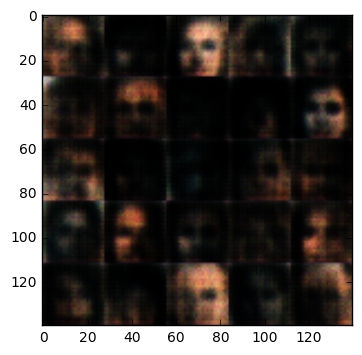

Epoch 1/1... Discriminator Loss: 0.3025... Generator Loss: 2.3900
Epoch 1/1... Discriminator Loss: 0.7710... Generator Loss: 1.7861
Epoch 1/1... Discriminator Loss: 0.5062... Generator Loss: 4.1242
Epoch 1/1... Discriminator Loss: 0.4824... Generator Loss: 1.3284
Epoch 1/1... Discriminator Loss: 0.2440... Generator Loss: 2.1995
Epoch 1/1... Discriminator Loss: 0.0923... Generator Loss: 3.6215
Epoch 1/1... Discriminator Loss: 0.1860... Generator Loss: 2.4889
Epoch 1/1... Discriminator Loss: 0.2612... Generator Loss: 1.9511
Epoch 1/1... Discriminator Loss: 0.7585... Generator Loss: 0.8976
Epoch 1/1... Discriminator Loss: 0.6003... Generator Loss: 1.1660


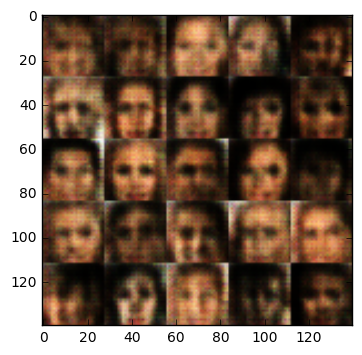

Epoch 1/1... Discriminator Loss: 0.4474... Generator Loss: 1.3808
Epoch 1/1... Discriminator Loss: 0.3152... Generator Loss: 1.8284
Epoch 1/1... Discriminator Loss: 0.2964... Generator Loss: 2.4908
Epoch 1/1... Discriminator Loss: 0.5403... Generator Loss: 1.2948
Epoch 1/1... Discriminator Loss: 0.2661... Generator Loss: 2.1892
Epoch 1/1... Discriminator Loss: 0.4042... Generator Loss: 1.4942
Epoch 1/1... Discriminator Loss: 0.3668... Generator Loss: 1.5328
Epoch 1/1... Discriminator Loss: 0.2994... Generator Loss: 2.3914
Epoch 1/1... Discriminator Loss: 0.5251... Generator Loss: 2.2985
Epoch 1/1... Discriminator Loss: 0.4563... Generator Loss: 1.3524


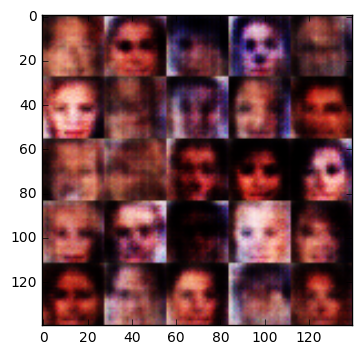

Epoch 1/1... Discriminator Loss: 1.1147... Generator Loss: 4.5215
Epoch 1/1... Discriminator Loss: 0.4149... Generator Loss: 1.5318
Epoch 1/1... Discriminator Loss: 0.6313... Generator Loss: 0.9803
Epoch 1/1... Discriminator Loss: 0.5751... Generator Loss: 1.1334
Epoch 1/1... Discriminator Loss: 0.3301... Generator Loss: 2.1953
Epoch 1/1... Discriminator Loss: 3.2721... Generator Loss: 6.8067
Epoch 1/1... Discriminator Loss: 0.7010... Generator Loss: 1.2767
Epoch 1/1... Discriminator Loss: 0.3822... Generator Loss: 1.9214
Epoch 1/1... Discriminator Loss: 0.4292... Generator Loss: 2.8931
Epoch 1/1... Discriminator Loss: 0.2993... Generator Loss: 2.0983


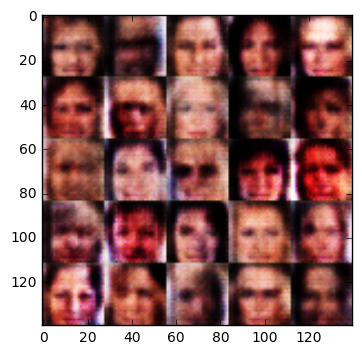

Epoch 1/1... Discriminator Loss: 0.2816... Generator Loss: 2.1921
Epoch 1/1... Discriminator Loss: 0.3772... Generator Loss: 2.0361
Epoch 1/1... Discriminator Loss: 0.8291... Generator Loss: 0.8222
Epoch 1/1... Discriminator Loss: 0.4015... Generator Loss: 1.9715
Epoch 1/1... Discriminator Loss: 0.4320... Generator Loss: 1.5770
Epoch 1/1... Discriminator Loss: 0.3724... Generator Loss: 3.3705
Epoch 1/1... Discriminator Loss: 0.6451... Generator Loss: 1.1216
Epoch 1/1... Discriminator Loss: 0.3019... Generator Loss: 2.4246
Epoch 1/1... Discriminator Loss: 0.1112... Generator Loss: 3.5194
Epoch 1/1... Discriminator Loss: 0.1225... Generator Loss: 3.7189


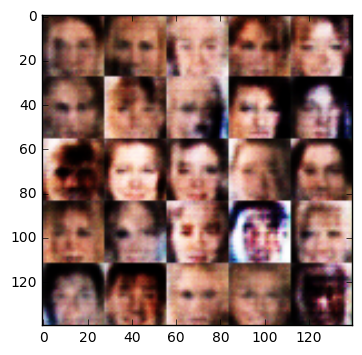

Epoch 1/1... Discriminator Loss: 0.3698... Generator Loss: 1.8599
Epoch 1/1... Discriminator Loss: 0.4758... Generator Loss: 1.5799
Epoch 1/1... Discriminator Loss: 0.3234... Generator Loss: 2.7177
Epoch 1/1... Discriminator Loss: 0.4522... Generator Loss: 1.5072
Epoch 1/1... Discriminator Loss: 0.4052... Generator Loss: 2.5051
Epoch 1/1... Discriminator Loss: 0.8277... Generator Loss: 0.8263
Epoch 1/1... Discriminator Loss: 0.5471... Generator Loss: 2.9918
Epoch 1/1... Discriminator Loss: 0.2514... Generator Loss: 4.0896
Epoch 1/1... Discriminator Loss: 0.1556... Generator Loss: 2.8912
Epoch 1/1... Discriminator Loss: 0.2422... Generator Loss: 2.5157


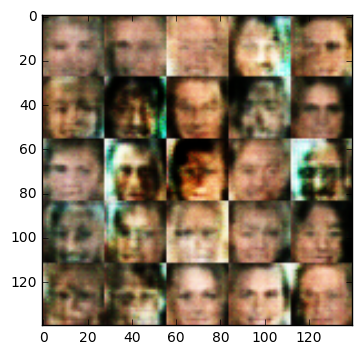

Epoch 1/1... Discriminator Loss: 0.4766... Generator Loss: 1.6651
Epoch 1/1... Discriminator Loss: 0.6885... Generator Loss: 1.0637
Epoch 1/1... Discriminator Loss: 0.5169... Generator Loss: 1.1486
Epoch 1/1... Discriminator Loss: 0.5117... Generator Loss: 1.2332
Epoch 1/1... Discriminator Loss: 0.4188... Generator Loss: 1.6466
Epoch 1/1... Discriminator Loss: 0.2097... Generator Loss: 3.7517
Epoch 1/1... Discriminator Loss: 0.4766... Generator Loss: 1.5104
Epoch 1/1... Discriminator Loss: 0.1652... Generator Loss: 2.6727
Epoch 1/1... Discriminator Loss: 0.3182... Generator Loss: 2.1899
Epoch 1/1... Discriminator Loss: 0.6977... Generator Loss: 2.7129


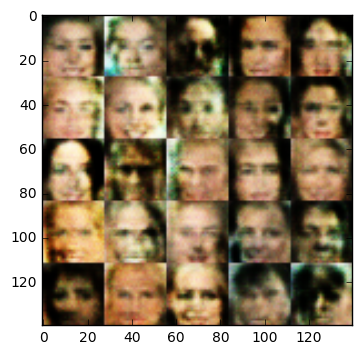

Epoch 1/1... Discriminator Loss: 0.4075... Generator Loss: 3.4671
Epoch 1/1... Discriminator Loss: 0.6588... Generator Loss: 0.9493
Epoch 1/1... Discriminator Loss: 1.1460... Generator Loss: 0.5460
Epoch 1/1... Discriminator Loss: 0.2489... Generator Loss: 2.3657
Epoch 1/1... Discriminator Loss: 0.4250... Generator Loss: 2.0724
Epoch 1/1... Discriminator Loss: 0.3236... Generator Loss: 2.1188
Epoch 1/1... Discriminator Loss: 0.5227... Generator Loss: 1.3324
Epoch 1/1... Discriminator Loss: 0.9175... Generator Loss: 0.6217
Epoch 1/1... Discriminator Loss: 0.3470... Generator Loss: 1.8786
Epoch 1/1... Discriminator Loss: 0.3729... Generator Loss: 2.0107


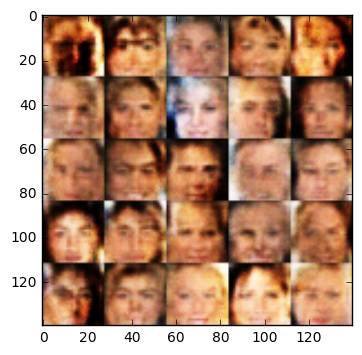

Epoch 1/1... Discriminator Loss: 2.2123... Generator Loss: 0.1747
Epoch 1/1... Discriminator Loss: 0.3044... Generator Loss: 2.0674
Epoch 1/1... Discriminator Loss: 0.6438... Generator Loss: 1.0102
Epoch 1/1... Discriminator Loss: 0.4211... Generator Loss: 1.7563
Epoch 1/1... Discriminator Loss: 0.2252... Generator Loss: 3.0754
Epoch 1/1... Discriminator Loss: 0.5962... Generator Loss: 1.0628
Epoch 1/1... Discriminator Loss: 0.3747... Generator Loss: 2.0130
Epoch 1/1... Discriminator Loss: 0.5451... Generator Loss: 3.1035
Epoch 1/1... Discriminator Loss: 0.2007... Generator Loss: 2.5703
Epoch 1/1... Discriminator Loss: 0.2292... Generator Loss: 2.5044


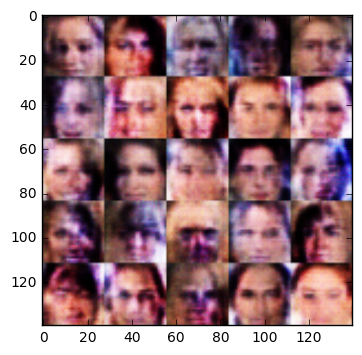

Epoch 1/1... Discriminator Loss: 0.7239... Generator Loss: 0.8744
Epoch 1/1... Discriminator Loss: 0.3868... Generator Loss: 1.3890
Epoch 1/1... Discriminator Loss: 1.5018... Generator Loss: 4.9778
Epoch 1/1... Discriminator Loss: 0.4289... Generator Loss: 2.7569
Epoch 1/1... Discriminator Loss: 0.6968... Generator Loss: 2.5330
Epoch 1/1... Discriminator Loss: 0.9612... Generator Loss: 2.3292
Epoch 1/1... Discriminator Loss: 0.6078... Generator Loss: 1.2165
Epoch 1/1... Discriminator Loss: 0.6887... Generator Loss: 0.9587
Epoch 1/1... Discriminator Loss: 0.2768... Generator Loss: 2.0387
Epoch 1/1... Discriminator Loss: 0.6449... Generator Loss: 1.3502


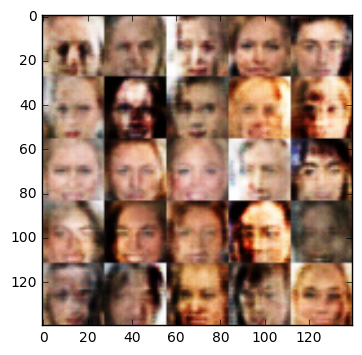

Epoch 1/1... Discriminator Loss: 0.4223... Generator Loss: 1.7360
Epoch 1/1... Discriminator Loss: 0.4601... Generator Loss: 2.5352
Epoch 1/1... Discriminator Loss: 0.3208... Generator Loss: 1.8612
Epoch 1/1... Discriminator Loss: 0.2358... Generator Loss: 2.4164
Epoch 1/1... Discriminator Loss: 0.6190... Generator Loss: 1.1784
Epoch 1/1... Discriminator Loss: 0.8322... Generator Loss: 3.0480
Epoch 1/1... Discriminator Loss: 0.9321... Generator Loss: 0.7304
Epoch 1/1... Discriminator Loss: 0.3216... Generator Loss: 1.9642
Epoch 1/1... Discriminator Loss: 0.3205... Generator Loss: 1.9864
Epoch 1/1... Discriminator Loss: 0.6629... Generator Loss: 1.0934


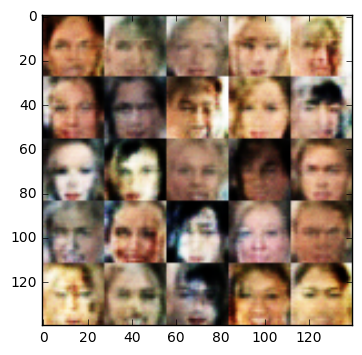

Epoch 1/1... Discriminator Loss: 0.4045... Generator Loss: 1.5667
Epoch 1/1... Discriminator Loss: 0.6688... Generator Loss: 0.9797
Epoch 1/1... Discriminator Loss: 0.6042... Generator Loss: 1.1165
Epoch 1/1... Discriminator Loss: 0.8120... Generator Loss: 0.7716
Epoch 1/1... Discriminator Loss: 0.6593... Generator Loss: 1.0161
Epoch 1/1... Discriminator Loss: 0.3043... Generator Loss: 2.4680
Epoch 1/1... Discriminator Loss: 0.5269... Generator Loss: 1.1916
Epoch 1/1... Discriminator Loss: 0.5394... Generator Loss: 1.4271
Epoch 1/1... Discriminator Loss: 1.7657... Generator Loss: 0.2567
Epoch 1/1... Discriminator Loss: 0.4673... Generator Loss: 1.4094


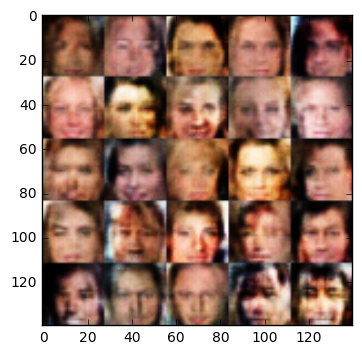

Epoch 1/1... Discriminator Loss: 0.4720... Generator Loss: 2.0704
Epoch 1/1... Discriminator Loss: 0.4005... Generator Loss: 1.6675
Epoch 1/1... Discriminator Loss: 0.3204... Generator Loss: 1.8333
Epoch 1/1... Discriminator Loss: 0.7074... Generator Loss: 0.8871
Epoch 1/1... Discriminator Loss: 0.2145... Generator Loss: 2.9800
Epoch 1/1... Discriminator Loss: 0.7406... Generator Loss: 2.6278
Epoch 1/1... Discriminator Loss: 0.6191... Generator Loss: 1.0253
Epoch 1/1... Discriminator Loss: 0.7783... Generator Loss: 1.0048
Epoch 1/1... Discriminator Loss: 0.2368... Generator Loss: 2.3073
Epoch 1/1... Discriminator Loss: 0.6527... Generator Loss: 1.1560


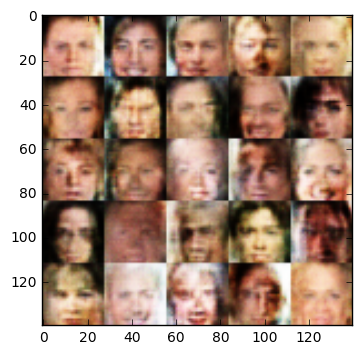

Epoch 1/1... Discriminator Loss: 0.5032... Generator Loss: 1.7569
Epoch 1/1... Discriminator Loss: 1.2120... Generator Loss: 0.4694
Epoch 1/1... Discriminator Loss: 0.2418... Generator Loss: 2.3289
Epoch 1/1... Discriminator Loss: 0.4330... Generator Loss: 1.6059
Epoch 1/1... Discriminator Loss: 0.6644... Generator Loss: 1.0301
Epoch 1/1... Discriminator Loss: 0.3589... Generator Loss: 3.3464
Epoch 1/1... Discriminator Loss: 0.8213... Generator Loss: 0.7920
Epoch 1/1... Discriminator Loss: 0.1593... Generator Loss: 2.6925
Epoch 1/1... Discriminator Loss: 0.5933... Generator Loss: 1.6112
Epoch 1/1... Discriminator Loss: 0.5296... Generator Loss: 1.1175


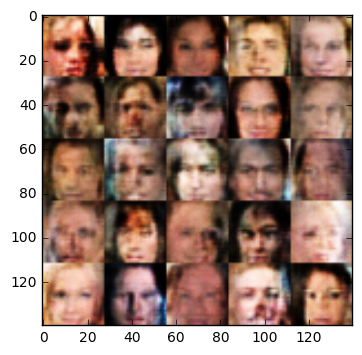

Epoch 1/1... Discriminator Loss: 0.9248... Generator Loss: 0.7397
Epoch 1/1... Discriminator Loss: 0.5203... Generator Loss: 1.2777
Epoch 1/1... Discriminator Loss: 1.0390... Generator Loss: 0.6426
Epoch 1/1... Discriminator Loss: 0.4369... Generator Loss: 1.6351
Epoch 1/1... Discriminator Loss: 0.4191... Generator Loss: 2.8791
Epoch 1/1... Discriminator Loss: 0.5292... Generator Loss: 1.2766
Epoch 1/1... Discriminator Loss: 0.5556... Generator Loss: 2.1739
Epoch 1/1... Discriminator Loss: 0.7412... Generator Loss: 1.0709
Epoch 1/1... Discriminator Loss: 0.2567... Generator Loss: 2.7107
Epoch 1/1... Discriminator Loss: 0.2290... Generator Loss: 3.2027


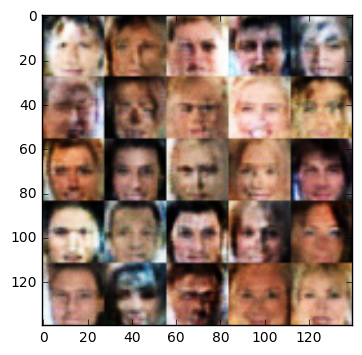

Epoch 1/1... Discriminator Loss: 0.2471... Generator Loss: 2.4890
Epoch 1/1... Discriminator Loss: 1.0926... Generator Loss: 0.5888
Epoch 1/1... Discriminator Loss: 0.3829... Generator Loss: 1.7137
Epoch 1/1... Discriminator Loss: 0.5546... Generator Loss: 1.1683
Epoch 1/1... Discriminator Loss: 0.5569... Generator Loss: 1.1043
Epoch 1/1... Discriminator Loss: 0.6223... Generator Loss: 4.1519
Epoch 1/1... Discriminator Loss: 0.8639... Generator Loss: 0.8796
Epoch 1/1... Discriminator Loss: 0.5944... Generator Loss: 1.1994
Epoch 1/1... Discriminator Loss: 0.5507... Generator Loss: 1.3853
Epoch 1/1... Discriminator Loss: 0.6296... Generator Loss: 1.0625


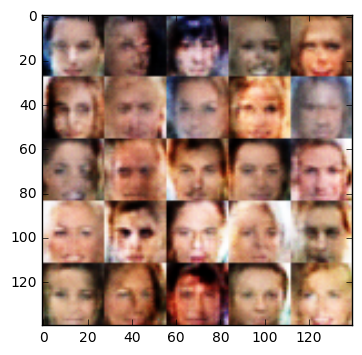

Epoch 1/1... Discriminator Loss: 0.4437... Generator Loss: 1.7944
Epoch 1/1... Discriminator Loss: 1.1362... Generator Loss: 0.5526
Epoch 1/1... Discriminator Loss: 0.3064... Generator Loss: 2.2143
Epoch 1/1... Discriminator Loss: 0.3086... Generator Loss: 2.0415
Epoch 1/1... Discriminator Loss: 0.1653... Generator Loss: 3.1595
Epoch 1/1... Discriminator Loss: 0.2537... Generator Loss: 2.5100
Epoch 1/1... Discriminator Loss: 0.2734... Generator Loss: 2.0044
Epoch 1/1... Discriminator Loss: 0.7395... Generator Loss: 2.0920
Epoch 1/1... Discriminator Loss: 0.7663... Generator Loss: 1.9388
Epoch 1/1... Discriminator Loss: 0.3623... Generator Loss: 1.7954


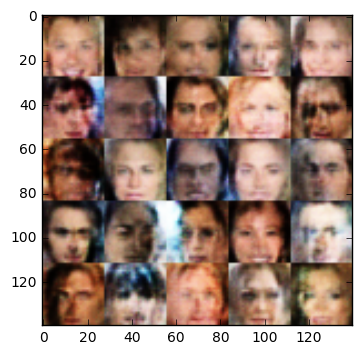

Epoch 1/1... Discriminator Loss: 1.1816... Generator Loss: 0.4527
Epoch 1/1... Discriminator Loss: 0.6885... Generator Loss: 1.0519
Epoch 1/1... Discriminator Loss: 0.4094... Generator Loss: 2.6815
Epoch 1/1... Discriminator Loss: 0.2434... Generator Loss: 2.2100
Epoch 1/1... Discriminator Loss: 0.6642... Generator Loss: 0.9728
Epoch 1/1... Discriminator Loss: 0.3228... Generator Loss: 2.6006
Epoch 1/1... Discriminator Loss: 0.7347... Generator Loss: 0.8508
Epoch 1/1... Discriminator Loss: 0.9220... Generator Loss: 0.7287
Epoch 1/1... Discriminator Loss: 0.4417... Generator Loss: 1.7536
Epoch 1/1... Discriminator Loss: 0.4275... Generator Loss: 2.1287


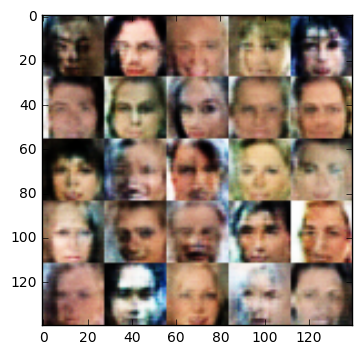

Epoch 1/1... Discriminator Loss: 0.2698... Generator Loss: 2.0628
Epoch 1/1... Discriminator Loss: 0.4424... Generator Loss: 2.0677
Epoch 1/1... Discriminator Loss: 0.5415... Generator Loss: 1.3533
Epoch 1/1... Discriminator Loss: 0.3346... Generator Loss: 2.1602
Epoch 1/1... Discriminator Loss: 0.3564... Generator Loss: 1.8504
Epoch 1/1... Discriminator Loss: 0.7363... Generator Loss: 0.8761
Epoch 1/1... Discriminator Loss: 0.7777... Generator Loss: 0.8585
Epoch 1/1... Discriminator Loss: 0.3005... Generator Loss: 2.4189
Epoch 1/1... Discriminator Loss: 1.3886... Generator Loss: 0.4144
Epoch 1/1... Discriminator Loss: 0.5899... Generator Loss: 3.5079


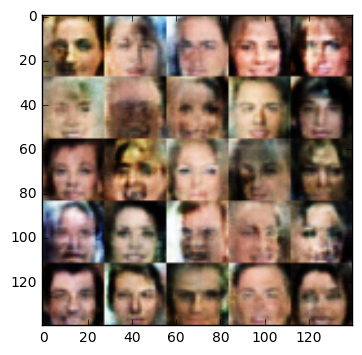

Epoch 1/1... Discriminator Loss: 0.9395... Generator Loss: 0.7641
Epoch 1/1... Discriminator Loss: 1.0760... Generator Loss: 0.5743
Epoch 1/1... Discriminator Loss: 0.4034... Generator Loss: 1.6355
Epoch 1/1... Discriminator Loss: 0.3528... Generator Loss: 2.2804
Epoch 1/1... Discriminator Loss: 0.8266... Generator Loss: 0.7898
Epoch 1/1... Discriminator Loss: 0.3639... Generator Loss: 1.7749
Epoch 1/1... Discriminator Loss: 0.5652... Generator Loss: 1.2683
Epoch 1/1... Discriminator Loss: 0.5180... Generator Loss: 1.4405
Epoch 1/1... Discriminator Loss: 0.2631... Generator Loss: 3.4059
Epoch 1/1... Discriminator Loss: 1.4382... Generator Loss: 0.4479


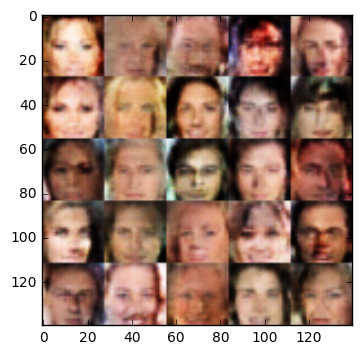

Epoch 1/1... Discriminator Loss: 0.1923... Generator Loss: 2.9062
Epoch 1/1... Discriminator Loss: 0.9891... Generator Loss: 0.6529
Epoch 1/1... Discriminator Loss: 0.5837... Generator Loss: 1.6557
Epoch 1/1... Discriminator Loss: 0.3810... Generator Loss: 1.7721
Epoch 1/1... Discriminator Loss: 0.4414... Generator Loss: 1.6203
Epoch 1/1... Discriminator Loss: 0.3127... Generator Loss: 1.8367
Epoch 1/1... Discriminator Loss: 0.2521... Generator Loss: 1.8392
Epoch 1/1... Discriminator Loss: 0.7836... Generator Loss: 0.8547
Epoch 1/1... Discriminator Loss: 1.2910... Generator Loss: 0.4364
Epoch 1/1... Discriminator Loss: 0.4818... Generator Loss: 1.1198


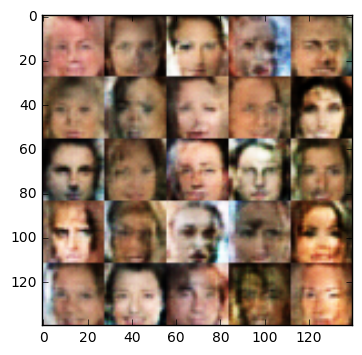

Epoch 1/1... Discriminator Loss: 0.2524... Generator Loss: 2.0619
Epoch 1/1... Discriminator Loss: 0.7041... Generator Loss: 0.9613
Epoch 1/1... Discriminator Loss: 0.5048... Generator Loss: 1.8418
Epoch 1/1... Discriminator Loss: 1.2630... Generator Loss: 0.4866
Epoch 1/1... Discriminator Loss: 0.7456... Generator Loss: 0.8663
Epoch 1/1... Discriminator Loss: 0.6268... Generator Loss: 1.2625
Epoch 1/1... Discriminator Loss: 0.4894... Generator Loss: 1.5560
Epoch 1/1... Discriminator Loss: 0.5107... Generator Loss: 1.3402
Epoch 1/1... Discriminator Loss: 0.6101... Generator Loss: 1.2263
Epoch 1/1... Discriminator Loss: 0.3564... Generator Loss: 1.8045


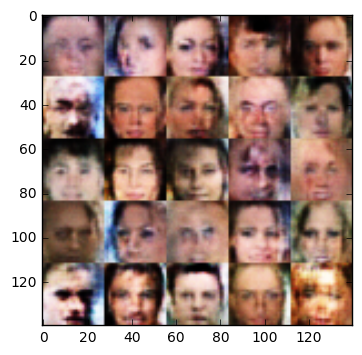

Epoch 1/1... Discriminator Loss: 0.4386... Generator Loss: 1.7550
Epoch 1/1... Discriminator Loss: 0.4938... Generator Loss: 1.8673
Epoch 1/1... Discriminator Loss: 0.4371... Generator Loss: 1.7091
Epoch 1/1... Discriminator Loss: 0.4104... Generator Loss: 1.6377
Epoch 1/1... Discriminator Loss: 0.5504... Generator Loss: 1.2120
Epoch 1/1... Discriminator Loss: 0.7958... Generator Loss: 0.7971
Epoch 1/1... Discriminator Loss: 0.6561... Generator Loss: 0.9676
Epoch 1/1... Discriminator Loss: 0.2585... Generator Loss: 1.9423
Epoch 1/1... Discriminator Loss: 0.5137... Generator Loss: 1.2600
Epoch 1/1... Discriminator Loss: 0.5559... Generator Loss: 1.9790


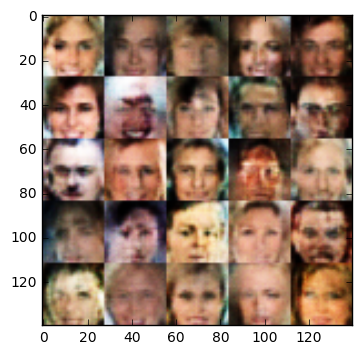

Epoch 1/1... Discriminator Loss: 0.3982... Generator Loss: 1.4626
Epoch 1/1... Discriminator Loss: 0.2695... Generator Loss: 2.4396
Epoch 1/1... Discriminator Loss: 1.6954... Generator Loss: 0.2679
Epoch 1/1... Discriminator Loss: 0.5142... Generator Loss: 1.2923
Epoch 1/1... Discriminator Loss: 0.2425... Generator Loss: 2.3501
Epoch 1/1... Discriminator Loss: 0.3238... Generator Loss: 1.9040
Epoch 1/1... Discriminator Loss: 1.0816... Generator Loss: 0.5761
Epoch 1/1... Discriminator Loss: 0.1996... Generator Loss: 2.3124
Epoch 1/1... Discriminator Loss: 0.3016... Generator Loss: 1.8166
Epoch 1/1... Discriminator Loss: 0.3305... Generator Loss: 1.5896


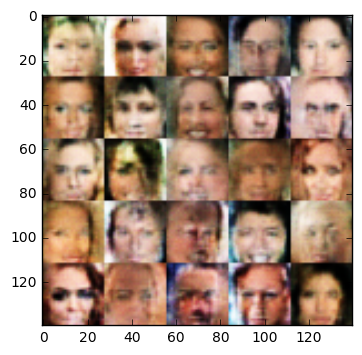

Epoch 1/1... Discriminator Loss: 0.1325... Generator Loss: 3.8659
Epoch 1/1... Discriminator Loss: 1.1178... Generator Loss: 0.5216
Epoch 1/1... Discriminator Loss: 0.3431... Generator Loss: 2.8375
Epoch 1/1... Discriminator Loss: 0.7976... Generator Loss: 0.7708
Epoch 1/1... Discriminator Loss: 0.3850... Generator Loss: 1.6605
Epoch 1/1... Discriminator Loss: 0.4202... Generator Loss: 1.6039
Epoch 1/1... Discriminator Loss: 0.4734... Generator Loss: 1.3450
Epoch 1/1... Discriminator Loss: 0.3740... Generator Loss: 2.2908
Epoch 1/1... Discriminator Loss: 0.7113... Generator Loss: 2.8831
Epoch 1/1... Discriminator Loss: 0.4179... Generator Loss: 1.6699


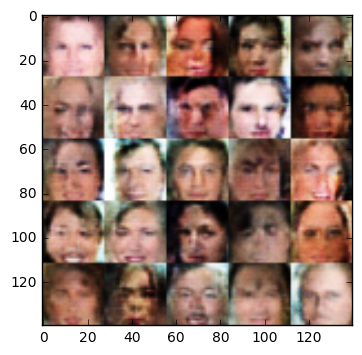

Epoch 1/1... Discriminator Loss: 0.3333... Generator Loss: 1.5515
Epoch 1/1... Discriminator Loss: 1.0275... Generator Loss: 0.6638
Epoch 1/1... Discriminator Loss: 0.4483... Generator Loss: 1.3863
Epoch 1/1... Discriminator Loss: 0.7588... Generator Loss: 0.8776
Epoch 1/1... Discriminator Loss: 0.3090... Generator Loss: 2.1390
Epoch 1/1... Discriminator Loss: 0.7862... Generator Loss: 0.8103
Epoch 1/1... Discriminator Loss: 0.7466... Generator Loss: 0.8719
Epoch 1/1... Discriminator Loss: 0.2442... Generator Loss: 2.1179
Epoch 1/1... Discriminator Loss: 0.3964... Generator Loss: 1.4962
Epoch 1/1... Discriminator Loss: 0.1468... Generator Loss: 3.1733


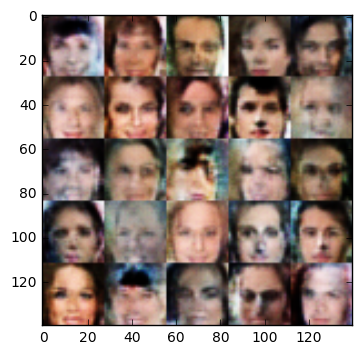

Epoch 1/1... Discriminator Loss: 0.2483... Generator Loss: 2.1582
Epoch 1/1... Discriminator Loss: 0.6479... Generator Loss: 2.2903
Epoch 1/1... Discriminator Loss: 0.7439... Generator Loss: 0.8814
Epoch 1/1... Discriminator Loss: 1.2227... Generator Loss: 0.4709
Epoch 1/1... Discriminator Loss: 0.5455... Generator Loss: 1.6026
Epoch 1/1... Discriminator Loss: 0.3501... Generator Loss: 1.9944
Epoch 1/1... Discriminator Loss: 0.4666... Generator Loss: 1.3624
Epoch 1/1... Discriminator Loss: 0.7478... Generator Loss: 0.9216
Epoch 1/1... Discriminator Loss: 0.6148... Generator Loss: 0.9649
Epoch 1/1... Discriminator Loss: 0.3285... Generator Loss: 1.9329


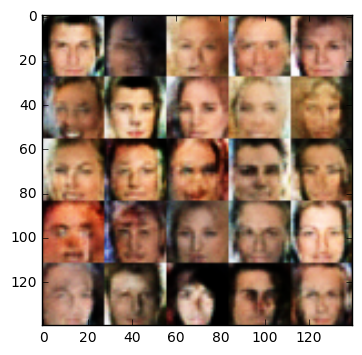

Epoch 1/1... Discriminator Loss: 1.1795... Generator Loss: 0.4889
Epoch 1/1... Discriminator Loss: 0.5227... Generator Loss: 1.3984
Epoch 1/1... Discriminator Loss: 0.9779... Generator Loss: 0.6976
Epoch 1/1... Discriminator Loss: 0.5048... Generator Loss: 1.3272
Epoch 1/1... Discriminator Loss: 0.3988... Generator Loss: 1.6006
Epoch 1/1... Discriminator Loss: 0.5307... Generator Loss: 1.1724
Epoch 1/1... Discriminator Loss: 1.0810... Generator Loss: 0.5445
Epoch 1/1... Discriminator Loss: 0.4163... Generator Loss: 1.5160
Epoch 1/1... Discriminator Loss: 0.8214... Generator Loss: 1.5137
Epoch 1/1... Discriminator Loss: 0.1978... Generator Loss: 2.6432


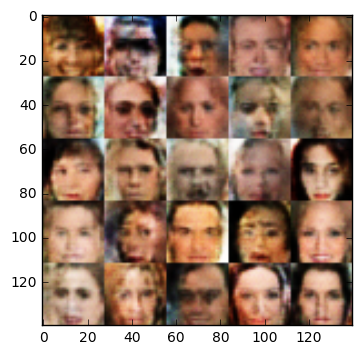

Epoch 1/1... Discriminator Loss: 0.1515... Generator Loss: 3.5633
Epoch 1/1... Discriminator Loss: 0.4117... Generator Loss: 1.4345
Epoch 1/1... Discriminator Loss: 0.4769... Generator Loss: 1.3169
Epoch 1/1... Discriminator Loss: 0.2293... Generator Loss: 2.5490
Epoch 1/1... Discriminator Loss: 0.2975... Generator Loss: 2.0151
Epoch 1/1... Discriminator Loss: 0.7241... Generator Loss: 0.8711
Epoch 1/1... Discriminator Loss: 1.8279... Generator Loss: 0.2305
Epoch 1/1... Discriminator Loss: 0.8552... Generator Loss: 2.5565
Epoch 1/1... Discriminator Loss: 0.9483... Generator Loss: 0.7034
Epoch 1/1... Discriminator Loss: 0.3274... Generator Loss: 1.9980


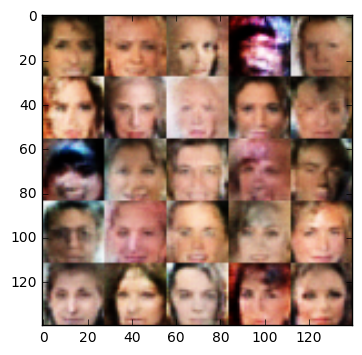

Epoch 1/1... Discriminator Loss: 0.2942... Generator Loss: 1.8398
Epoch 1/1... Discriminator Loss: 0.6209... Generator Loss: 1.3153
Epoch 1/1... Discriminator Loss: 0.6753... Generator Loss: 0.9900
Epoch 1/1... Discriminator Loss: 0.6669... Generator Loss: 0.9914
Epoch 1/1... Discriminator Loss: 1.2355... Generator Loss: 0.5565
Epoch 1/1... Discriminator Loss: 0.6262... Generator Loss: 1.1228
Epoch 1/1... Discriminator Loss: 1.2081... Generator Loss: 0.5505
Epoch 1/1... Discriminator Loss: 0.6242... Generator Loss: 1.0947
Epoch 1/1... Discriminator Loss: 0.2153... Generator Loss: 2.5370
Epoch 1/1... Discriminator Loss: 0.5438... Generator Loss: 1.2840


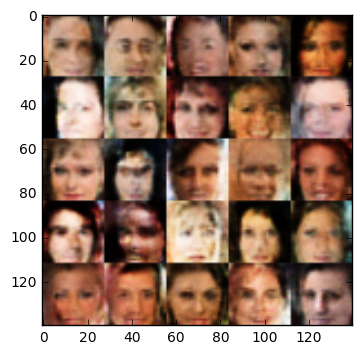

Epoch 1/1... Discriminator Loss: 0.3031... Generator Loss: 2.1036
Epoch 1/1... Discriminator Loss: 0.9603... Generator Loss: 0.6534
Epoch 1/1... Discriminator Loss: 0.1398... Generator Loss: 2.7816
Epoch 1/1... Discriminator Loss: 0.2487... Generator Loss: 2.3160
Epoch 1/1... Discriminator Loss: 0.3342... Generator Loss: 1.6831
Epoch 1/1... Discriminator Loss: 0.3568... Generator Loss: 1.5605
Epoch 1/1... Discriminator Loss: 0.3039... Generator Loss: 1.7536
Epoch 1/1... Discriminator Loss: 0.1341... Generator Loss: 3.0332
Epoch 1/1... Discriminator Loss: 0.5011... Generator Loss: 1.3219
Epoch 1/1... Discriminator Loss: 0.9853... Generator Loss: 1.0749


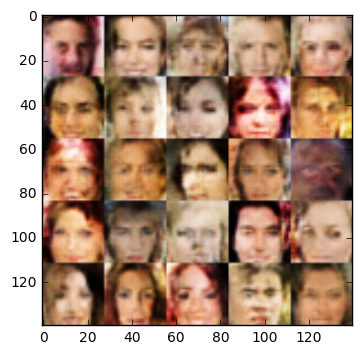

Epoch 1/1... Discriminator Loss: 0.5767... Generator Loss: 3.5974
Epoch 1/1... Discriminator Loss: 0.5843... Generator Loss: 2.3050
Epoch 1/1... Discriminator Loss: 0.3155... Generator Loss: 1.9411
Epoch 1/1... Discriminator Loss: 1.4568... Generator Loss: 0.3711
Epoch 1/1... Discriminator Loss: 1.0306... Generator Loss: 0.6805
Epoch 1/1... Discriminator Loss: 1.3327... Generator Loss: 0.3813
Epoch 1/1... Discriminator Loss: 0.2483... Generator Loss: 4.3413
Epoch 1/1... Discriminator Loss: 0.6394... Generator Loss: 1.2198
Epoch 1/1... Discriminator Loss: 0.5528... Generator Loss: 2.9824
Epoch 1/1... Discriminator Loss: 0.5328... Generator Loss: 1.1823


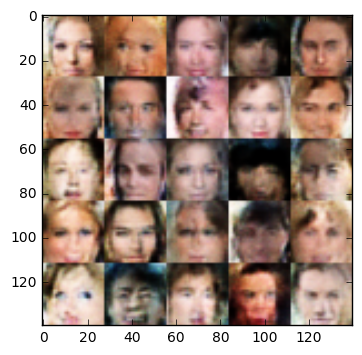

Epoch 1/1... Discriminator Loss: 0.5861... Generator Loss: 1.2697
Epoch 1/1... Discriminator Loss: 0.3367... Generator Loss: 1.8855
Epoch 1/1... Discriminator Loss: 0.5151... Generator Loss: 2.7708
Epoch 1/1... Discriminator Loss: 0.2999... Generator Loss: 1.9023
Epoch 1/1... Discriminator Loss: 0.7553... Generator Loss: 0.9977
Epoch 1/1... Discriminator Loss: 0.0516... Generator Loss: 5.0092
Epoch 1/1... Discriminator Loss: 0.4301... Generator Loss: 2.8551
Epoch 1/1... Discriminator Loss: 1.1748... Generator Loss: 0.4951
Epoch 1/1... Discriminator Loss: 0.4132... Generator Loss: 1.6455
Epoch 1/1... Discriminator Loss: 0.7409... Generator Loss: 0.8456


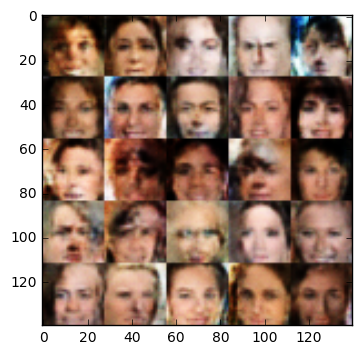

Epoch 1/1... Discriminator Loss: 0.9799... Generator Loss: 0.6247
Epoch 1/1... Discriminator Loss: 0.3032... Generator Loss: 1.9445
Epoch 1/1... Discriminator Loss: 0.4607... Generator Loss: 1.3384
Epoch 1/1... Discriminator Loss: 0.2338... Generator Loss: 2.4321
Epoch 1/1... Discriminator Loss: 0.2596... Generator Loss: 2.1560
Epoch 1/1... Discriminator Loss: 0.4680... Generator Loss: 1.3357
Epoch 1/1... Discriminator Loss: 0.2906... Generator Loss: 2.2367
Epoch 1/1... Discriminator Loss: 0.2069... Generator Loss: 2.2776
Epoch 1/1... Discriminator Loss: 0.4643... Generator Loss: 1.3056
Epoch 1/1... Discriminator Loss: 0.5285... Generator Loss: 1.3509


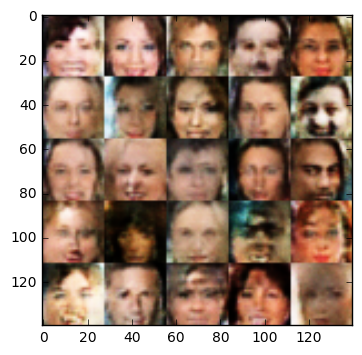

Epoch 1/1... Discriminator Loss: 1.0051... Generator Loss: 0.6545
Epoch 1/1... Discriminator Loss: 0.3384... Generator Loss: 1.7472
Epoch 1/1... Discriminator Loss: 1.3907... Generator Loss: 0.3957
Epoch 1/1... Discriminator Loss: 0.1811... Generator Loss: 2.4743
Epoch 1/1... Discriminator Loss: 0.4219... Generator Loss: 1.4847
Epoch 1/1... Discriminator Loss: 0.2640... Generator Loss: 1.9778
Epoch 1/1... Discriminator Loss: 0.5548... Generator Loss: 1.1745
Epoch 1/1... Discriminator Loss: 0.4131... Generator Loss: 2.2150
Epoch 1/1... Discriminator Loss: 0.5525... Generator Loss: 3.0445
Epoch 1/1... Discriminator Loss: 0.5832... Generator Loss: 3.2178


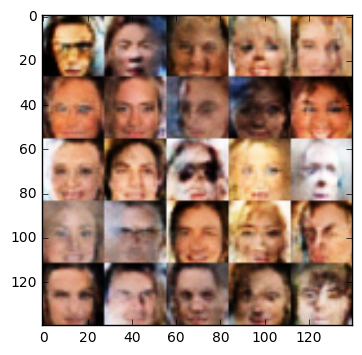

Epoch 1/1... Discriminator Loss: 0.1877... Generator Loss: 2.7794
Epoch 1/1... Discriminator Loss: 0.2824... Generator Loss: 2.1893
Epoch 1/1... Discriminator Loss: 0.6955... Generator Loss: 0.9785
Epoch 1/1... Discriminator Loss: 0.1896... Generator Loss: 5.0510
Epoch 1/1... Discriminator Loss: 1.2974... Generator Loss: 0.4510
Epoch 1/1... Discriminator Loss: 0.3695... Generator Loss: 2.0784
Epoch 1/1... Discriminator Loss: 0.4928... Generator Loss: 1.7207
Epoch 1/1... Discriminator Loss: 0.5795... Generator Loss: 1.5462
Epoch 1/1... Discriminator Loss: 0.4639... Generator Loss: 1.2304
Epoch 1/1... Discriminator Loss: 0.2746... Generator Loss: 2.1423


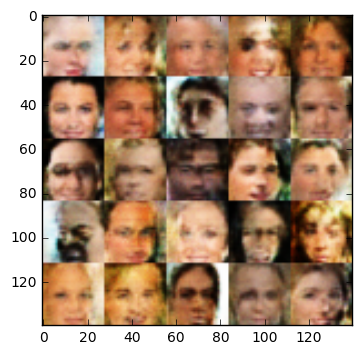

Epoch 1/1... Discriminator Loss: 0.8668... Generator Loss: 0.8123
Epoch 1/1... Discriminator Loss: 0.4200... Generator Loss: 1.5491
Epoch 1/1... Discriminator Loss: 0.4965... Generator Loss: 1.3143
Epoch 1/1... Discriminator Loss: 0.2231... Generator Loss: 2.1314
Epoch 1/1... Discriminator Loss: 0.2679... Generator Loss: 2.3466
Epoch 1/1... Discriminator Loss: 0.6546... Generator Loss: 1.0866
Epoch 1/1... Discriminator Loss: 0.4016... Generator Loss: 2.2976
Epoch 1/1... Discriminator Loss: 0.7483... Generator Loss: 1.0130
Epoch 1/1... Discriminator Loss: 0.2862... Generator Loss: 2.8381
Epoch 1/1... Discriminator Loss: 0.4176... Generator Loss: 2.5412


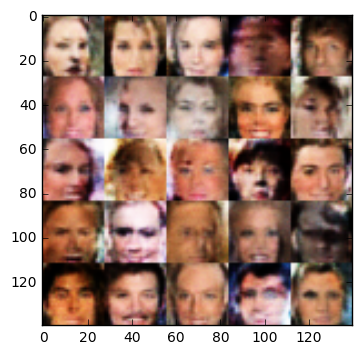

Epoch 1/1... Discriminator Loss: 0.1401... Generator Loss: 3.9782
Epoch 1/1... Discriminator Loss: 0.5341... Generator Loss: 1.2028
Epoch 1/1... Discriminator Loss: 0.7591... Generator Loss: 0.9517
Epoch 1/1... Discriminator Loss: 0.3560... Generator Loss: 1.6709
Epoch 1/1... Discriminator Loss: 1.7723... Generator Loss: 0.3230
Epoch 1/1... Discriminator Loss: 1.3768... Generator Loss: 0.3970
Epoch 1/1... Discriminator Loss: 0.6002... Generator Loss: 1.3358
Epoch 1/1... Discriminator Loss: 0.6919... Generator Loss: 0.8876
Epoch 1/1... Discriminator Loss: 0.2122... Generator Loss: 3.1105
Epoch 1/1... Discriminator Loss: 0.2906... Generator Loss: 2.2099


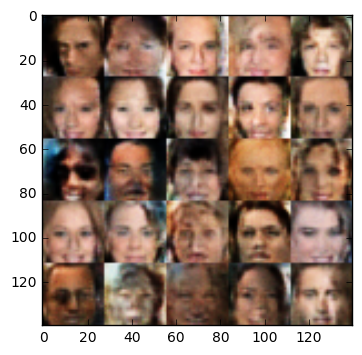

Epoch 1/1... Discriminator Loss: 0.2928... Generator Loss: 1.7003
Epoch 1/1... Discriminator Loss: 0.1589... Generator Loss: 3.0125
Epoch 1/1... Discriminator Loss: 0.1542... Generator Loss: 2.9812
Epoch 1/1... Discriminator Loss: 0.2241... Generator Loss: 2.0310
Epoch 1/1... Discriminator Loss: 0.1997... Generator Loss: 2.8091
Epoch 1/1... Discriminator Loss: 0.2273... Generator Loss: 3.1930
Epoch 1/1... Discriminator Loss: 0.8054... Generator Loss: 0.7757
Epoch 1/1... Discriminator Loss: 0.1295... Generator Loss: 4.3971
Epoch 1/1... Discriminator Loss: 0.0604... Generator Loss: 4.9439
Epoch 1/1... Discriminator Loss: 0.3794... Generator Loss: 1.4487


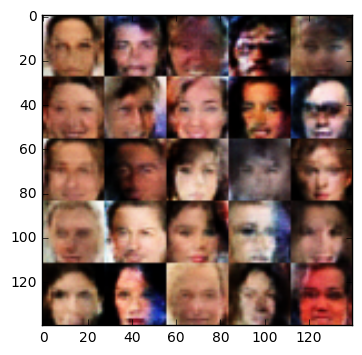

Epoch 1/1... Discriminator Loss: 0.3370... Generator Loss: 1.7295
Epoch 1/1... Discriminator Loss: 0.3698... Generator Loss: 1.5213
Epoch 1/1... Discriminator Loss: 0.0911... Generator Loss: 4.5138
Epoch 1/1... Discriminator Loss: 0.5677... Generator Loss: 1.1143
Epoch 1/1... Discriminator Loss: 0.2413... Generator Loss: 4.1683
Epoch 1/1... Discriminator Loss: 0.6979... Generator Loss: 0.9190
Epoch 1/1... Discriminator Loss: 0.3495... Generator Loss: 1.6030
Epoch 1/1... Discriminator Loss: 0.4256... Generator Loss: 1.5466
Epoch 1/1... Discriminator Loss: 0.1884... Generator Loss: 2.7015
Epoch 1/1... Discriminator Loss: 0.9722... Generator Loss: 1.9281


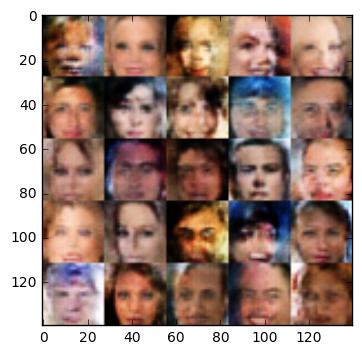

Epoch 1/1... Discriminator Loss: 0.9961... Generator Loss: 0.5661
Epoch 1/1... Discriminator Loss: 0.7788... Generator Loss: 0.9726
Epoch 1/1... Discriminator Loss: 0.1436... Generator Loss: 2.8336
Epoch 1/1... Discriminator Loss: 0.2842... Generator Loss: 2.0458
Epoch 1/1... Discriminator Loss: 0.2141... Generator Loss: 2.8872
Epoch 1/1... Discriminator Loss: 0.3572... Generator Loss: 1.5263
Epoch 1/1... Discriminator Loss: 0.5998... Generator Loss: 3.0284
Epoch 1/1... Discriminator Loss: 1.3636... Generator Loss: 0.3564
Epoch 1/1... Discriminator Loss: 0.3550... Generator Loss: 3.7274
Epoch 1/1... Discriminator Loss: 0.1568... Generator Loss: 4.5511


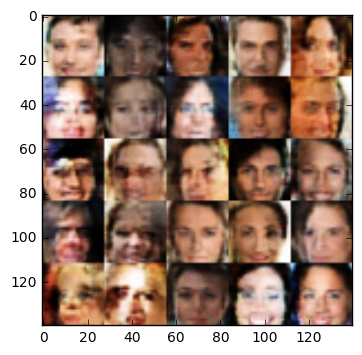

Epoch 1/1... Discriminator Loss: 0.3808... Generator Loss: 1.7812
Epoch 1/1... Discriminator Loss: 0.1984... Generator Loss: 2.5954
Epoch 1/1... Discriminator Loss: 0.6018... Generator Loss: 1.2636
Epoch 1/1... Discriminator Loss: 0.2808... Generator Loss: 4.0830
Epoch 1/1... Discriminator Loss: 0.1293... Generator Loss: 4.4675
Epoch 1/1... Discriminator Loss: 0.4562... Generator Loss: 1.3676
Epoch 1/1... Discriminator Loss: 1.3362... Generator Loss: 0.4280
Epoch 1/1... Discriminator Loss: 0.1954... Generator Loss: 2.6149
Epoch 1/1... Discriminator Loss: 0.2720... Generator Loss: 2.7901
Epoch 1/1... Discriminator Loss: 0.1623... Generator Loss: 2.4011


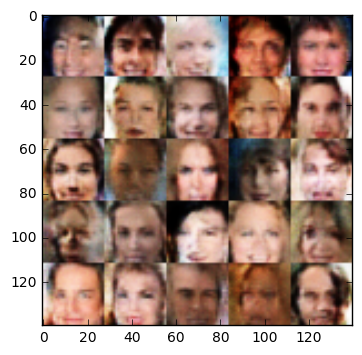

Epoch 1/1... Discriminator Loss: 0.2777... Generator Loss: 1.8080
Epoch 1/1... Discriminator Loss: 0.1641... Generator Loss: 2.5320
Epoch 1/1... Discriminator Loss: 0.2532... Generator Loss: 1.9547
Epoch 1/1... Discriminator Loss: 0.1012... Generator Loss: 3.0962
Epoch 1/1... Discriminator Loss: 0.0921... Generator Loss: 3.1627
Epoch 1/1... Discriminator Loss: 1.8268... Generator Loss: 3.1791
Epoch 1/1... Discriminator Loss: 0.5008... Generator Loss: 2.3806
Epoch 1/1... Discriminator Loss: 0.9971... Generator Loss: 0.6197
Epoch 1/1... Discriminator Loss: 0.2310... Generator Loss: 2.5274
Epoch 1/1... Discriminator Loss: 0.1133... Generator Loss: 3.1002


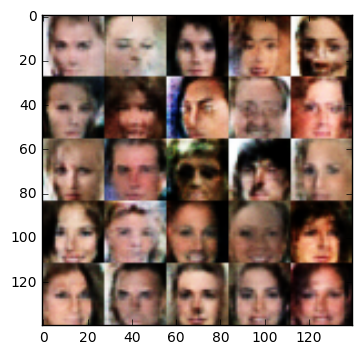

Epoch 1/1... Discriminator Loss: 0.3942... Generator Loss: 1.9596
Epoch 1/1... Discriminator Loss: 0.4380... Generator Loss: 5.9222
Epoch 1/1... Discriminator Loss: 0.3193... Generator Loss: 1.7377
Epoch 1/1... Discriminator Loss: 0.1786... Generator Loss: 3.2651
Epoch 1/1... Discriminator Loss: 0.3023... Generator Loss: 1.7646
Epoch 1/1... Discriminator Loss: 0.1231... Generator Loss: 3.1044
Epoch 1/1... Discriminator Loss: 0.1306... Generator Loss: 3.4459
Epoch 1/1... Discriminator Loss: 0.2039... Generator Loss: 2.2815
Epoch 1/1... Discriminator Loss: 0.1271... Generator Loss: 4.0189
Epoch 1/1... Discriminator Loss: 0.2573... Generator Loss: 2.0940


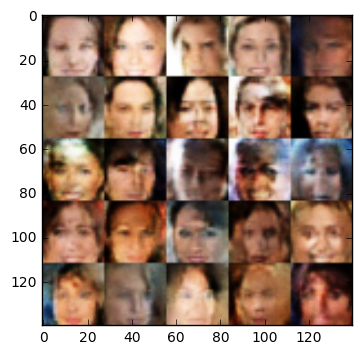

Epoch 1/1... Discriminator Loss: 0.1732... Generator Loss: 2.2414
Epoch 1/1... Discriminator Loss: 0.4072... Generator Loss: 1.4366
Epoch 1/1... Discriminator Loss: 0.1165... Generator Loss: 2.9160
Epoch 1/1... Discriminator Loss: 0.1694... Generator Loss: 2.4184
Epoch 1/1... Discriminator Loss: 0.1156... Generator Loss: 4.6048
Epoch 1/1... Discriminator Loss: 2.2255... Generator Loss: 0.1723
Epoch 1/1... Discriminator Loss: 0.3369... Generator Loss: 1.7261
Epoch 1/1... Discriminator Loss: 0.4721... Generator Loss: 1.5282
Epoch 1/1... Discriminator Loss: 0.2422... Generator Loss: 2.4924
Epoch 1/1... Discriminator Loss: 0.8541... Generator Loss: 0.7165


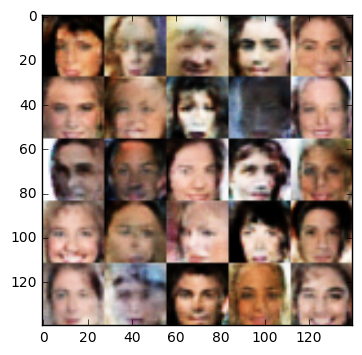

Epoch 1/1... Discriminator Loss: 1.2311... Generator Loss: 0.4344
Epoch 1/1... Discriminator Loss: 1.1180... Generator Loss: 0.5172
Epoch 1/1... Discriminator Loss: 0.1563... Generator Loss: 4.9775
Epoch 1/1... Discriminator Loss: 0.1046... Generator Loss: 6.1672
Epoch 1/1... Discriminator Loss: 0.0965... Generator Loss: 3.3694
Epoch 1/1... Discriminator Loss: 2.8261... Generator Loss: 4.6060
Epoch 1/1... Discriminator Loss: 0.5758... Generator Loss: 1.1549
Epoch 1/1... Discriminator Loss: 0.4946... Generator Loss: 1.1543
Epoch 1/1... Discriminator Loss: 0.4463... Generator Loss: 1.3168
Epoch 1/1... Discriminator Loss: 0.9280... Generator Loss: 0.7965


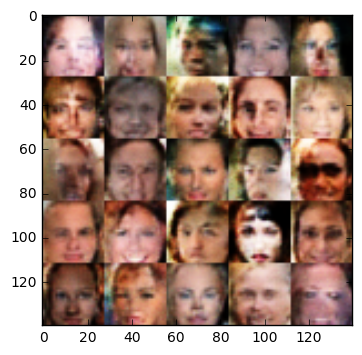

Epoch 1/1... Discriminator Loss: 0.9224... Generator Loss: 0.7188
Epoch 1/1... Discriminator Loss: 0.5474... Generator Loss: 1.1634
Epoch 1/1... Discriminator Loss: 0.2474... Generator Loss: 1.8580
Epoch 1/1... Discriminator Loss: 0.8825... Generator Loss: 3.0553
Epoch 1/1... Discriminator Loss: 0.6651... Generator Loss: 0.9778
Epoch 1/1... Discriminator Loss: 0.6655... Generator Loss: 1.0129
Epoch 1/1... Discriminator Loss: 0.1044... Generator Loss: 3.7988
Epoch 1/1... Discriminator Loss: 0.6251... Generator Loss: 1.0653
Epoch 1/1... Discriminator Loss: 0.1598... Generator Loss: 2.4979
Epoch 1/1... Discriminator Loss: 0.9369... Generator Loss: 1.5586


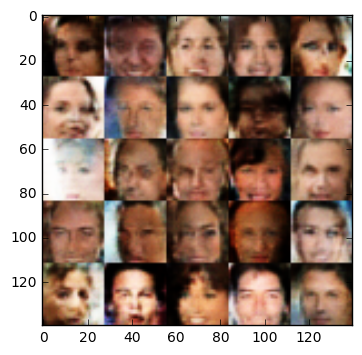

Epoch 1/1... Discriminator Loss: 0.2241... Generator Loss: 2.2340
Epoch 1/1... Discriminator Loss: 0.6296... Generator Loss: 2.2498
Epoch 1/1... Discriminator Loss: 0.1815... Generator Loss: 2.9282
Epoch 1/1... Discriminator Loss: 0.2121... Generator Loss: 1.9146
Epoch 1/1... Discriminator Loss: 0.0533... Generator Loss: 4.2752
Epoch 1/1... Discriminator Loss: 0.2003... Generator Loss: 2.0649
Epoch 1/1... Discriminator Loss: 0.0742... Generator Loss: 4.8154
Epoch 1/1... Discriminator Loss: 0.2643... Generator Loss: 1.9651
Epoch 1/1... Discriminator Loss: 1.1039... Generator Loss: 3.1486
Epoch 1/1... Discriminator Loss: 0.3249... Generator Loss: 5.5960


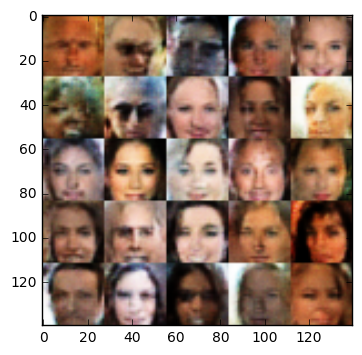

Epoch 1/1... Discriminator Loss: 0.5646... Generator Loss: 1.0203
Epoch 1/1... Discriminator Loss: 0.1502... Generator Loss: 4.3428
Epoch 1/1... Discriminator Loss: 0.2615... Generator Loss: 5.1170
Epoch 1/1... Discriminator Loss: 0.3166... Generator Loss: 1.6911
Epoch 1/1... Discriminator Loss: 0.0959... Generator Loss: 4.5192
Epoch 1/1... Discriminator Loss: 0.5695... Generator Loss: 1.0078
Epoch 1/1... Discriminator Loss: 0.1790... Generator Loss: 2.4996
Epoch 1/1... Discriminator Loss: 0.2901... Generator Loss: 2.4095
Epoch 1/1... Discriminator Loss: 0.3577... Generator Loss: 1.3994
Epoch 1/1... Discriminator Loss: 0.4598... Generator Loss: 1.4681


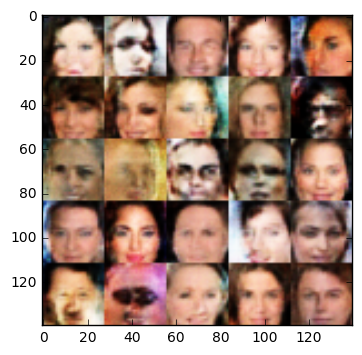

Epoch 1/1... Discriminator Loss: 0.2593... Generator Loss: 2.0226
Epoch 1/1... Discriminator Loss: 0.0632... Generator Loss: 4.7890
Epoch 1/1... Discriminator Loss: 2.4174... Generator Loss: 0.1339
Epoch 1/1... Discriminator Loss: 0.2571... Generator Loss: 2.0358
Epoch 1/1... Discriminator Loss: 2.0784... Generator Loss: 0.1977
Epoch 1/1... Discriminator Loss: 0.2263... Generator Loss: 2.7240
Epoch 1/1... Discriminator Loss: 0.4482... Generator Loss: 1.4528
Epoch 1/1... Discriminator Loss: 0.1512... Generator Loss: 3.0527
Epoch 1/1... Discriminator Loss: 0.2550... Generator Loss: 2.2108
Epoch 1/1... Discriminator Loss: 0.1770... Generator Loss: 2.8939


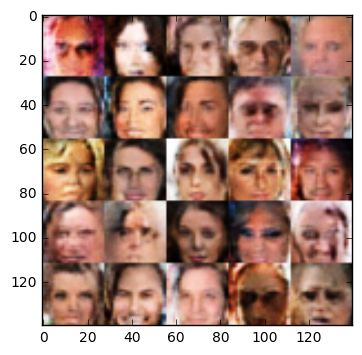

Epoch 1/1... Discriminator Loss: 0.2045... Generator Loss: 3.8032
Epoch 1/1... Discriminator Loss: 0.0898... Generator Loss: 3.0307
Epoch 1/1... Discriminator Loss: 0.1290... Generator Loss: 3.2180
Epoch 1/1... Discriminator Loss: 0.1158... Generator Loss: 3.5110
Epoch 1/1... Discriminator Loss: 0.0612... Generator Loss: 5.3776
Epoch 1/1... Discriminator Loss: 1.5299... Generator Loss: 0.3473
Epoch 1/1... Discriminator Loss: 0.8145... Generator Loss: 3.2243
Epoch 1/1... Discriminator Loss: 0.4467... Generator Loss: 1.5425
Epoch 1/1... Discriminator Loss: 0.7941... Generator Loss: 0.8432
Epoch 1/1... Discriminator Loss: 0.0944... Generator Loss: 4.3717


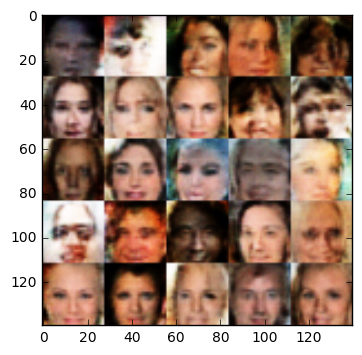

Epoch 1/1... Discriminator Loss: 1.2546... Generator Loss: 0.4746
Epoch 1/1... Discriminator Loss: 0.1713... Generator Loss: 3.1686
Epoch 1/1... Discriminator Loss: 1.3622... Generator Loss: 0.4690
Epoch 1/1... Discriminator Loss: 0.1978... Generator Loss: 2.1925
Epoch 1/1... Discriminator Loss: 0.2822... Generator Loss: 2.0325
Epoch 1/1... Discriminator Loss: 0.2335... Generator Loss: 1.8992
Epoch 1/1... Discriminator Loss: 0.7316... Generator Loss: 0.8875
Epoch 1/1... Discriminator Loss: 0.2466... Generator Loss: 2.9710
Epoch 1/1... Discriminator Loss: 0.4195... Generator Loss: 1.4338
Epoch 1/1... Discriminator Loss: 0.5709... Generator Loss: 1.0924


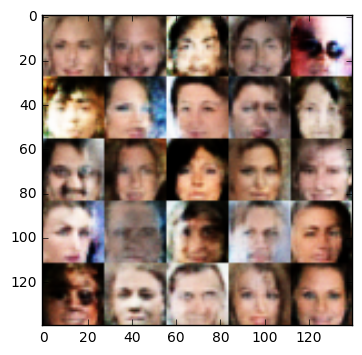

Epoch 1/1... Discriminator Loss: 1.6113... Generator Loss: 0.3413
Epoch 1/1... Discriminator Loss: 0.6434... Generator Loss: 1.1796
Epoch 1/1... Discriminator Loss: 0.6995... Generator Loss: 5.9797
Epoch 1/1... Discriminator Loss: 0.7868... Generator Loss: 2.8364
Epoch 1/1... Discriminator Loss: 0.0623... Generator Loss: 5.1079
Epoch 1/1... Discriminator Loss: 0.1736... Generator Loss: 3.5899
Epoch 1/1... Discriminator Loss: 0.2171... Generator Loss: 5.3779
Epoch 1/1... Discriminator Loss: 1.7436... Generator Loss: 0.2896
Epoch 1/1... Discriminator Loss: 0.2845... Generator Loss: 1.7011
Epoch 1/1... Discriminator Loss: 0.1328... Generator Loss: 2.8138


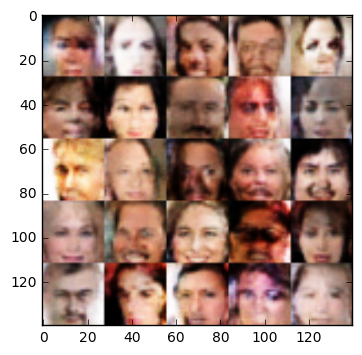

Epoch 1/1... Discriminator Loss: 0.0985... Generator Loss: 4.7729
Epoch 1/1... Discriminator Loss: 0.1045... Generator Loss: 3.5898
Epoch 1/1... Discriminator Loss: 0.1297... Generator Loss: 3.4482
Epoch 1/1... Discriminator Loss: 0.1799... Generator Loss: 2.3085
Epoch 1/1... Discriminator Loss: 0.6564... Generator Loss: 1.0112
Epoch 1/1... Discriminator Loss: 0.1861... Generator Loss: 5.3275
Epoch 1/1... Discriminator Loss: 0.2363... Generator Loss: 2.2518
Epoch 1/1... Discriminator Loss: 0.1023... Generator Loss: 3.2616
Epoch 1/1... Discriminator Loss: 0.1884... Generator Loss: 2.4617
Epoch 1/1... Discriminator Loss: 0.5879... Generator Loss: 1.1335


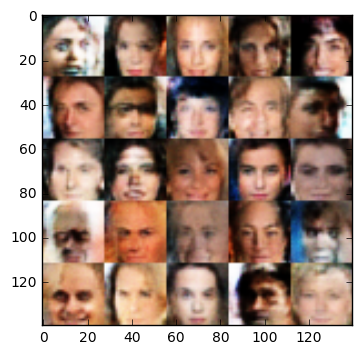

Epoch 1/1... Discriminator Loss: 0.0534... Generator Loss: 4.8906
Epoch 1/1... Discriminator Loss: 0.5814... Generator Loss: 7.0776
Epoch 1/1... Discriminator Loss: 0.2950... Generator Loss: 2.6202
Epoch 1/1... Discriminator Loss: 0.4714... Generator Loss: 1.3690
Epoch 1/1... Discriminator Loss: 0.1163... Generator Loss: 10.9194
Epoch 1/1... Discriminator Loss: 0.7847... Generator Loss: 0.9882
Epoch 1/1... Discriminator Loss: 3.4702... Generator Loss: 0.0470
Epoch 1/1... Discriminator Loss: 0.1449... Generator Loss: 3.2169
Epoch 1/1... Discriminator Loss: 0.1323... Generator Loss: 2.7449
Epoch 1/1... Discriminator Loss: 0.1239... Generator Loss: 3.2572


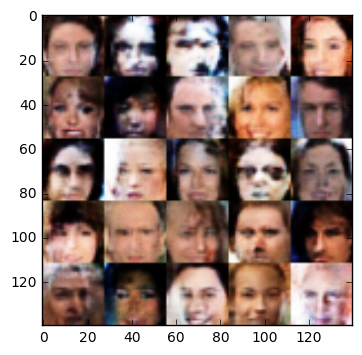

Epoch 1/1... Discriminator Loss: 0.6738... Generator Loss: 5.9399
Epoch 1/1... Discriminator Loss: 0.1486... Generator Loss: 3.5772
Epoch 1/1... Discriminator Loss: 0.0721... Generator Loss: 4.3550
Epoch 1/1... Discriminator Loss: 0.8506... Generator Loss: 2.4512
Epoch 1/1... Discriminator Loss: 1.6244... Generator Loss: 0.3061
Epoch 1/1... Discriminator Loss: 1.0669... Generator Loss: 0.6132
Epoch 1/1... Discriminator Loss: 0.1734... Generator Loss: 4.1280
Epoch 1/1... Discriminator Loss: 0.1598... Generator Loss: 2.9162
Epoch 1/1... Discriminator Loss: 1.8931... Generator Loss: 0.2649
Epoch 1/1... Discriminator Loss: 1.2629... Generator Loss: 0.4910


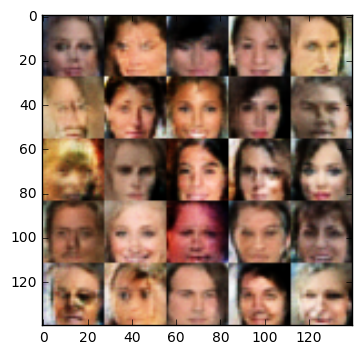

Epoch 1/1... Discriminator Loss: 1.3810... Generator Loss: 0.4005
Epoch 1/1... Discriminator Loss: 0.1673... Generator Loss: 4.0049
Epoch 1/1... Discriminator Loss: 0.1986... Generator Loss: 3.7018
Epoch 1/1... Discriminator Loss: 0.9297... Generator Loss: 0.7382
Epoch 1/1... Discriminator Loss: 0.2577... Generator Loss: 8.8636
Epoch 1/1... Discriminator Loss: 0.1729... Generator Loss: 4.3503
Epoch 1/1... Discriminator Loss: 0.5110... Generator Loss: 1.1844
Epoch 1/1... Discriminator Loss: 0.1721... Generator Loss: 4.1311
Epoch 1/1... Discriminator Loss: 1.5026... Generator Loss: 0.3528
Epoch 1/1... Discriminator Loss: 0.2612... Generator Loss: 2.1660


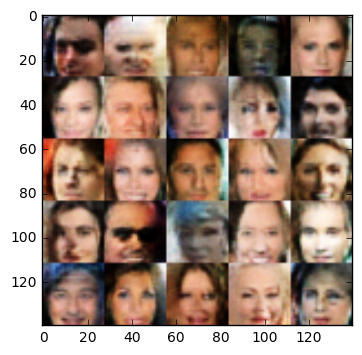

Epoch 1/1... Discriminator Loss: 0.5325... Generator Loss: 1.9353
Epoch 1/1... Discriminator Loss: 1.4312... Generator Loss: 0.3506
Epoch 1/1... Discriminator Loss: 0.1187... Generator Loss: 4.1386
Epoch 1/1... Discriminator Loss: 0.1227... Generator Loss: 3.9557
Epoch 1/1... Discriminator Loss: 0.1711... Generator Loss: 2.8553
Epoch 1/1... Discriminator Loss: 0.7500... Generator Loss: 0.9637
Epoch 1/1... Discriminator Loss: 0.1239... Generator Loss: 5.8400
Epoch 1/1... Discriminator Loss: 0.3166... Generator Loss: 3.3596
Epoch 1/1... Discriminator Loss: 0.1980... Generator Loss: 2.2316
Epoch 1/1... Discriminator Loss: 0.0834... Generator Loss: 4.7511


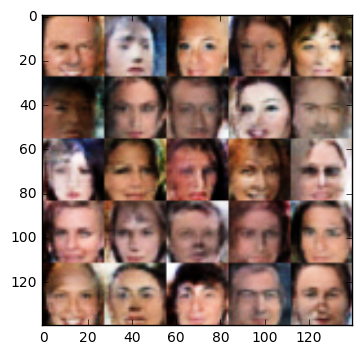

Epoch 1/1... Discriminator Loss: 0.1258... Generator Loss: 8.5157
Epoch 1/1... Discriminator Loss: 0.3516... Generator Loss: 2.6693
Epoch 1/1... Discriminator Loss: 0.8906... Generator Loss: 4.4733
Epoch 1/1... Discriminator Loss: 0.2325... Generator Loss: 2.3938
Epoch 1/1... Discriminator Loss: 0.5042... Generator Loss: 1.6156
Epoch 1/1... Discriminator Loss: 0.0921... Generator Loss: 4.0459
Epoch 1/1... Discriminator Loss: 0.1252... Generator Loss: 2.4655
Epoch 1/1... Discriminator Loss: 0.1850... Generator Loss: 2.8549
Epoch 1/1... Discriminator Loss: 0.2237... Generator Loss: 2.8561
Epoch 1/1... Discriminator Loss: 0.6689... Generator Loss: 0.9717


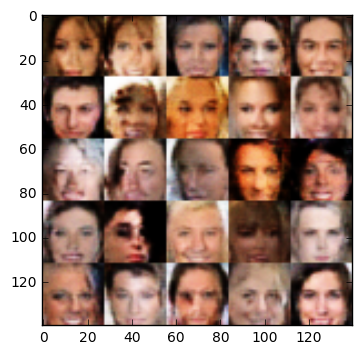

Epoch 1/1... Discriminator Loss: 0.1334... Generator Loss: 5.5353
Epoch 1/1... Discriminator Loss: 1.4065... Generator Loss: 0.3847
Epoch 1/1... Discriminator Loss: 0.6496... Generator Loss: 2.0463
Epoch 1/1... Discriminator Loss: 0.8945... Generator Loss: 0.7698
Epoch 1/1... Discriminator Loss: 0.1466... Generator Loss: 4.5108
Epoch 1/1... Discriminator Loss: 0.9441... Generator Loss: 0.6267
Epoch 1/1... Discriminator Loss: 0.1319... Generator Loss: 2.8616
Epoch 1/1... Discriminator Loss: 0.2022... Generator Loss: 3.5482
Epoch 1/1... Discriminator Loss: 1.2279... Generator Loss: 0.5034
Epoch 1/1... Discriminator Loss: 2.5044... Generator Loss: 0.1153


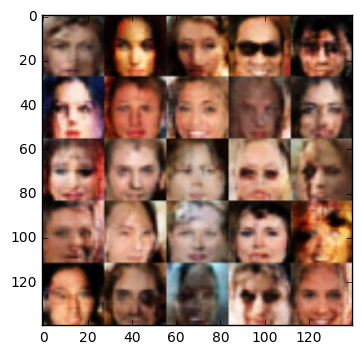

Epoch 1/1... Discriminator Loss: 0.5535... Generator Loss: 1.7122
Epoch 1/1... Discriminator Loss: 0.1988... Generator Loss: 3.0777
Epoch 1/1... Discriminator Loss: 0.1603... Generator Loss: 3.6417
Epoch 1/1... Discriminator Loss: 0.3685... Generator Loss: 4.4558


In [14]:
batch_size = 32
z_dim = 100
learning_rate = 0.0001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.